# Imports

In [3]:
!pip install igraph

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 26.2 MB/s eta 0:00:00


In [4]:
import numpy as np
import igraph as ig
import matplotlib.pyplot as plt
import random
from collections import Counter
import scipy.stats as stats
from matplotlib.colors import hsv_to_rgb
from scipy import stats

In [4]:
random.seed(0)

# Generating Random Networks

##1 - Create random networks using ER model

### (a)

In [6]:
n = 900
ps = [0.002, 0.006, 0.012, 0.045, 0.1]

In [6]:
graphs = []

for p in ps:
  graph = ig.Graph.Erdos_Renyi(n=n, p=p, directed=False, loops=False)
  graphs.append(graph)

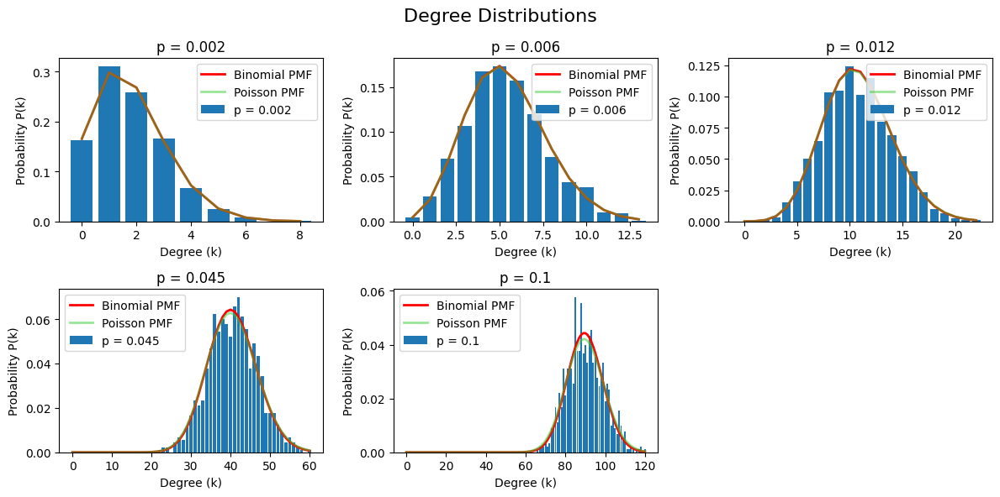

In [9]:
plt.figure(figsize=(12, 6))
plt.suptitle('Degree Distributions', fontsize=16)
plt.subplots_adjust(hspace=0.5)
results = {}

for graph_id, graph in enumerate(graphs):
  p = ps[graph_id]
  degrees = graph.degree()
  degree_counts = Counter(degrees)
  total_nodes = len(degrees)
  degree_dist = {k: v/total_nodes for k, v in degree_counts.items()}

  #ploting
  max_degree = max(degrees)
  x = np.arange(max_degree + 1)
  y = [degree_dist.get(d, 0) for d in x]
  plt.subplot(2, 3, graph_id+1)
  plt.bar(x, y, label=f'p = {p}')
  bin_pmf = [stats.binom.pmf(d, n-1, p) for d in x]
  plt.plot(x, bin_pmf, 'r-', linewidth=2, label='Binomial PMF')

  lambda_val = p * (n-1)

  poisson_pmf = [stats.poisson.pmf(d, lambda_val) for d in x]
  plt.plot(x, poisson_pmf, 'limegreen', alpha=0.5, linewidth=2, label='Poisson PMF')

  plt.title(f'p = {p}')
  plt.xlabel('Degree (k)')
  plt.ylabel('Probability P(k)')
  plt.legend()

  results[p]={
      'mean': np.mean(degrees).item(),
      'variance': np.var(degrees).item(),
      'theoretical_mean': (n - 1) * p, #binomial
      'theoretical_variance': (n - 1) * p * (1 - p), #binomial
  }

plt.tight_layout()

In [10]:
results

{0.002: {'mean': 1.7733333333333334,
  'variance': 1.7308444444444442,
  'theoretical_mean': 1.798,
  'theoretical_variance': 1.794404},
 0.006: {'mean': 5.3822222222222225,
  'variance': 5.425017283950617,
  'theoretical_mean': 5.394,
  'theoretical_variance': 5.361636},
 0.012: {'mean': 10.706666666666667,
  'variance': 10.965066666666669,
  'theoretical_mean': 10.788,
  'theoretical_variance': 10.658544000000001},
 0.045: {'mean': 40.59111111111111,
  'variance': 38.12836543209877,
  'theoretical_mean': 40.455,
  'theoretical_variance': 38.634525},
 0.1: {'mean': 90.01777777777778,
  'variance': 84.8419061728395,
  'theoretical_mean': 89.9,
  'theoretical_variance': 80.91000000000001}}

Report:

*  Short answer: the distribution is binomial.

  Based on the results, we observe that the distribution is ***binomial***. This can be mathematically proven as follows:

  For any given node, having an edge with each of the other n−1 nodes can be viewed as n−1 independent Bernoulli trials (similar to coin flips) with a success probability of p.

  The probability that a node has a degree k in the Erdős-Rényi (ER) model is given by the binomial probability mass function:

  $$ P(\text{degree(v)} = k) = \binom{n-1}{k} p^k (1-p)^{n-1-k} $$

  This distribution is a binomial distribution with parameters (n−1,p).

  It is also worth mentioning that for small values of p (such as p=0.002), the binomial distribution can be approximated by a Poisson distribution.

  This Poisson is most accurate when the network is large and p is small. As the network size grows large and p becomes small, the binomial distribution converges to a Poisson distribution. In large networks with a low connection probability, creation of edge is a rare event.

* Mean and variances: The theoretical and empirical mean and variances are approximately equal.

  p = 0.002:

  Mean: 1.773,
  Variance: 1.731,
  Theoretical Mean: 1.798,
  Theoretical Variance: 1.794

  p = 0.006:

  Mean: 5.382,
  Variance: 5.425,
  Theoretical Mean: 5.394,
  Theoretical Variance: 5.362

  p = 0.012:

  Mean: 10.707,
  Variance: 10.965,
  Theoretical Mean: 10.788,
  Theoretical Variance: 10.659

  p = 0.045:

  Mean: 40.591,
  Variance: 38.128,
  Theoretical Mean: 40.455,
  Theoretical Variance: 38.635

  p = 0.1:

  Mean: 90.018,
  Variance: 84.842,
  Theoretical Mean: 89.900,
  Theoretical Variance: 80.910


### (b)

In [16]:
num_trials = 1000
generated_trial_graphs = {}
results = {}

for p in ps:
  connected_count = 0
  total_gcc_size = 0
  example_graph = None
  example_gcc_size = 0
  example_diameter = 0
  generated_trial_graphs[p] = []
  found_example_graph = False

  for trial in range(num_trials):
      graph = ig.Graph.Erdos_Renyi(n=n, p=p)

      if graph.is_connected():
          connected_count += 1

      else:
          if not found_example_graph:
              found_example_graph = True
              components = graph.components()
              largest_component = max(components, key=len)
              example_gcc_size = len(largest_component)
              subgraph = graph.subgraph(largest_component)
              example_diameter = subgraph.diameter()
              is_example_graph_connected = False

      generated_trial_graphs[p].append(graph)

      clusters = graph.clusters()
      max_size = max(len(cluster) for cluster in clusters)
      total_gcc_size += max_size

  connectivity_prob = connected_count / num_trials

  avg_size = total_gcc_size / num_trials

  if not found_example_graph:
      example_gcc_size = n
      example_diameter = graph.diameter()
      is_example_graph_connected = True

  results[p]={
      'connectivity_prob': connectivity_prob,
      'avg_gcc_size': avg_size,
      'example_gcc_size': example_gcc_size,
      'example_diameter': example_diameter,
      'found_example_graph': found_example_graph,
      'is_example_graph_connected': is_example_graph_connected
  }

<ipython-input-16-bb250e6f0743>:32: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  clusters = graph.clusters()


In [17]:
print('theoretical_threshold = ', np.log(n)/n)
print('theoretical_threshold_giant = ', 1/n)

theoretical_threshold =  0.007558216403693679
theoretical_threshold_giant =  0.0011111111111111111


In [18]:
results

{0.002: {'connectivity_prob': 0.0,
  'avg_gcc_size': 657.177,
  'example_gcc_size': 639,
  'example_diameter': 26,
  'found_example_graph': True,
  'is_example_graph_connected': False},
 0.006: {'connectivity_prob': 0.017,
  'avg_gcc_size': 895.861,
  'example_gcc_size': 897,
  'example_diameter': 8,
  'found_example_graph': True,
  'is_example_graph_connected': False},
 0.012: {'connectivity_prob': 0.985,
  'avg_gcc_size': 899.985,
  'example_gcc_size': 899,
  'example_diameter': 5,
  'found_example_graph': True,
  'is_example_graph_connected': False},
 0.045: {'connectivity_prob': 1.0,
  'avg_gcc_size': 900.0,
  'example_gcc_size': 900,
  'example_diameter': 3,
  'found_example_graph': False,
  'is_example_graph_connected': True},
 0.1: {'connectivity_prob': 1.0,
  'avg_gcc_size': 900.0,
  'example_gcc_size': 900,
  'example_diameter': 3,
  'found_example_graph': False,
  'is_example_graph_connected': True}}

Report:

* We have run the code 1000 times to estimate the connectivity probability.

  p = 0.002: Connectivity probability is 0

  p = 0.006: Connectivity probability is 0.017

  p = 0.012: Connectivity probability is 0.985

  p = 0.045: Connectivity probability is 1

  p = 0.1: Connectivity probability is 1

* GCC diameters of one example of graphs. For p = 0.045 and p = 0.1, the example graph is connected and for the other ps, the example graph is not connected.

 p = 0.002: diameter is 26, gcc_size is 639

 p = 0.006: diameter is 8, gcc_size is 897,

 p = 0.012: diameter is 5, gcc size is 899.

 p = 0.045: all networks are connected at these probabilities, the gcc is the entire graph, and the diameter is 3.

 p = 0.1: all networks are connected at these probabilities, the gcc is the entire graph, and the diameter is 3.


* Conclusions:

  For ps larger than 0.012, the network's connection probability will get close to 1.

  For ps smaller than 0.06, the probability of the network being connected is close to 0.

  The diameter of the GCC becomes smaller as p becomes larger.

  For the connected networks, the GCC will be the size of the generated network.

  The theoretical values for connectivity threshld (log(n)/n: 0.007558216403693679) and the theoretical threshold for GCC be the entire graph (0.0011111111111111111) supports our observations.

### (c)

<ipython-input-12-0f709fbc88e3>:29: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  clusters = G.clusters()


p = 0.000500, Avg GCC size = 1.01%, High coverage prob = 0.00%
p = 0.001000, Avg GCC size = 5.58%, High coverage prob = 0.00%
p = 0.001111 (theoretical emergence threshold), Avg GCC size = 9.28%, High coverage prob = 0.00%
p = 0.001500, Avg GCC size = 44.67%, High coverage prob = 0.00%
p = 0.002000, Avg GCC size = 73.49%, High coverage prob = 0.00%
p = 0.002500, Avg GCC size = 85.00%, High coverage prob = 0.00%
p = 0.003000, Avg GCC size = 91.47%, High coverage prob = 0.00%
p = 0.003500, Avg GCC size = 94.94%, High coverage prob = 0.00%
p = 0.004000, Avg GCC size = 97.02%, High coverage prob = 0.00%
p = 0.004500, Avg GCC size = 98.08%, High coverage prob = 4.00%
p = 0.005000, Avg GCC size = 98.86%, High coverage prob = 44.00%
p = 0.005500, Avg GCC size = 99.29%, High coverage prob = 87.00%
p = 0.006000, Avg GCC size = 99.55%, High coverage prob = 99.00%
p = 0.006500, Avg GCC size = 99.72%, High coverage prob = 100.00%
p = 0.007000, Avg GCC size = 99.81%, High coverage prob = 100.00%
p 

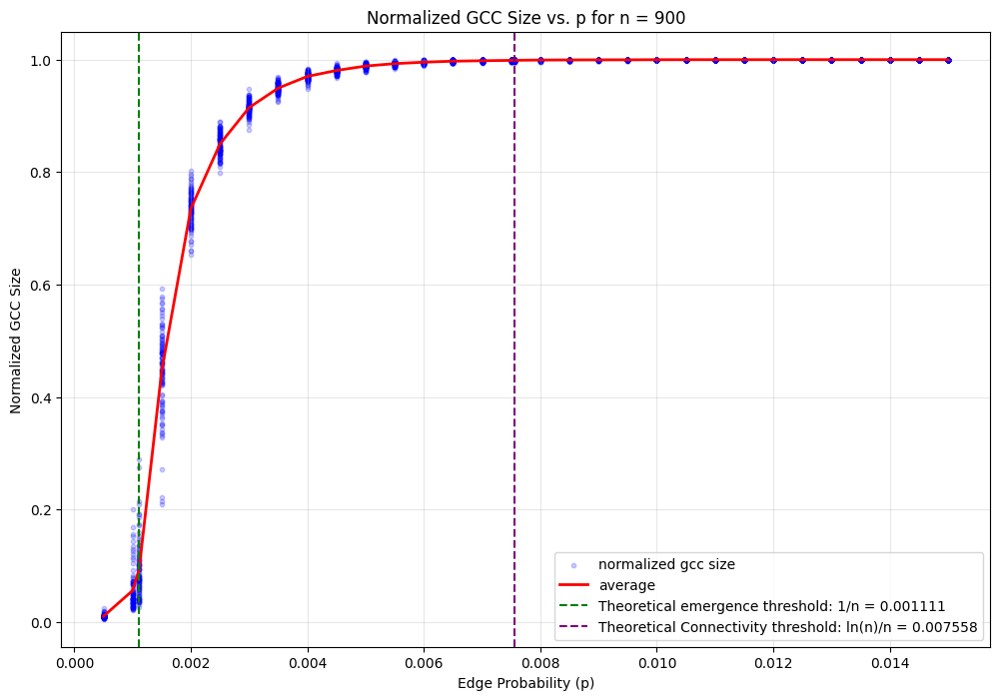

p = 0.001500 (emergence threshold), Avg GCC size = 44.67%, High coverage prob = 0.00%
p = 0.006000 (high-coverage threshold), Avg GCC size = 99.55%, High coverage prob = 99.00%


In [12]:
num_trials=100

emergence_threshold = 1/n
connectivity_threshold = np.log(n)/n

pmin = 0.0005
pmax = 0.015
num_steps = 30

p_values = np.linspace(pmin, pmax, num_steps)

if emergence_threshold not in p_values:
    p_values = np.append(p_values, emergence_threshold)
if connectivity_threshold not in p_values:
    p_values = np.append(p_values, connectivity_threshold)

p_values = np.sort(p_values)

results = {}

plt.figure(figsize=(12, 8))

for p in p_values:
    gcc_sizes = []

    for trial in range(num_trials):
        G = ig.Graph.Erdos_Renyi(n=n, p=p)

        clusters = G.clusters()
        gcc_size = max(len(cluster) for cluster in clusters)
        normalized_size = gcc_size / n

        gcc_sizes.append(normalized_size)

    avg_gcc_size = np.mean(gcc_sizes)

    high_coverage_count = sum(1 for size in gcc_sizes if size >= 0.99)
    high_coverage_prob = high_coverage_count / num_trials

    results[p.item()] = {
        'gcc_sizes': gcc_sizes,
        'avg_gcc_size': avg_gcc_size,
        'high_coverage_prob': high_coverage_prob
    }

    if abs(p - emergence_threshold) < 1e-6:
        print(f"p = {p:.6f} (theoretical emergence threshold), Avg GCC size = {avg_gcc_size*100:.2f}%, High coverage prob = {high_coverage_prob*100:.2f}%")
    elif abs(p - connectivity_threshold) < 1e-6:
        print(f"p = {p:.6f} (theoretical connectivity threshold), Avg GCC size = {avg_gcc_size*100:.2f}%, High coverage prob = {high_coverage_prob*100:.2f}%")
    else:
        print(f"p = {p:.6f}, Avg GCC size = {avg_gcc_size*100:.2f}%, High coverage prob = {high_coverage_prob*100:.2f}%")

all_p = []
all_sizes = []

for p, info in results.items():
    for size in info['gcc_sizes']:
        all_p.append(p)
        all_sizes.append(size)

plt.scatter(all_p, all_sizes, alpha=0.2, s=10, color='blue', label='normalized gcc size')

avg_p = [p for p in results.keys()]
avg_sizes = [result['avg_gcc_size'] for p, result in results.items()]

plt.plot(avg_p, avg_sizes, 'r-', linewidth=2, label='average')

plt.axvline(x=emergence_threshold, color='green', linestyle='--', label=f'Theoretical emergence threshold: 1/n = {emergence_threshold:.6f}')
plt.axvline(x=connectivity_threshold, color='purple', linestyle='--', label=f'Theoretical Connectivity threshold: ln(n)/n = {connectivity_threshold:.6f}')

plt.xlabel('Edge Probability (p)')
plt.ylabel('Normalized GCC Size')
plt.title(f'Normalized GCC Size vs. p for n = {n}')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig('gcc_vs_p.png')
plt.show()

emergence_criterion = 0.1
for p, r in results.items():
    if r['avg_gcc_size'] > emergence_criterion:
        print(
            f"p = {p:.6f} (emergence threshold), "
            f"Avg GCC size = {r['avg_gcc_size']*100:.2f}%, "
            f"High coverage prob = {r['high_coverage_prob']*100:.2f}%"
        )
        break

high_coverage_criterion = 0.95
for p, r in results.items():
    if r['high_coverage_prob'] > high_coverage_criterion:
        print(
            f"p = {p:.6f} (high-coverage threshold), "
            f"Avg GCC size = {r['avg_gcc_size']*100:.2f}%, "
            f"High coverage prob = {r['high_coverage_prob']*100:.2f}%"
        )
        break


Report:

* We have generated 100 graphs for each p value. From the properties of p = ln  (n)/n, we know that the probabilities above this threshold guarantee that the graph will be surely connected. As a result, since ln(n)/n is equal to 0.007, we define p_max to be 0.015.

* i. Emergence is where the average GCC size exceeds 10% of the total network size (0.1n) and the normalized GCC size is at least 0.1. This thereshold is the point at which the network undergoes a transition from a disconnected state to a connected state.
  
  It happened in p = 0.001500 which is near p = 1/n = 0.001111.


* ii. Based on the experimented ps, we can find that when p is larger than 0.006, 99% of the nodes in almost every experiment (in >95% of trials) is connected. This value is in agreement with the theoretical value O(ln(n)/n), which is 0.007.

### (d)


Analyzing GCC size for c = 0.5:
n = 100, p = 0.005000, Avg GCC size = 6.11 (6.11%)


<ipython-input-41-6cc7e9487e25>:23: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  clusters = G.clusters()


n = 1100, p = 0.000455, Avg GCC size = 11.38 (1.03%)
n = 2100, p = 0.000238, Avg GCC size = 13.36 (0.64%)
n = 3100, p = 0.000161, Avg GCC size = 15.83 (0.51%)
n = 4100, p = 0.000122, Avg GCC size = 15.34 (0.37%)
n = 5100, p = 0.000098, Avg GCC size = 15.92 (0.31%)
n = 6100, p = 0.000082, Avg GCC size = 17.18 (0.28%)
n = 7100, p = 0.000070, Avg GCC size = 17.44 (0.25%)
n = 8100, p = 0.000062, Avg GCC size = 17.64 (0.22%)
n = 9100, p = 0.000055, Avg GCC size = 17.18 (0.19%)

Analyzing GCC size for c = 1:
n = 100, p = 0.010000, Avg GCC size = 19.78 (19.78%)
n = 1100, p = 0.000909, Avg GCC size = 97.52 (8.87%)
n = 2100, p = 0.000476, Avg GCC size = 144.42 (6.88%)
n = 3100, p = 0.000323, Avg GCC size = 189.93 (6.13%)
n = 4100, p = 0.000244, Avg GCC size = 259.69 (6.33%)
n = 5100, p = 0.000196, Avg GCC size = 299.84 (5.88%)
n = 6100, p = 0.000164, Avg GCC size = 318.72 (5.22%)
n = 7100, p = 0.000141, Avg GCC size = 350.88 (4.94%)
n = 8100, p = 0.000123, Avg GCC size = 412.36 (5.09%)
n = 9100

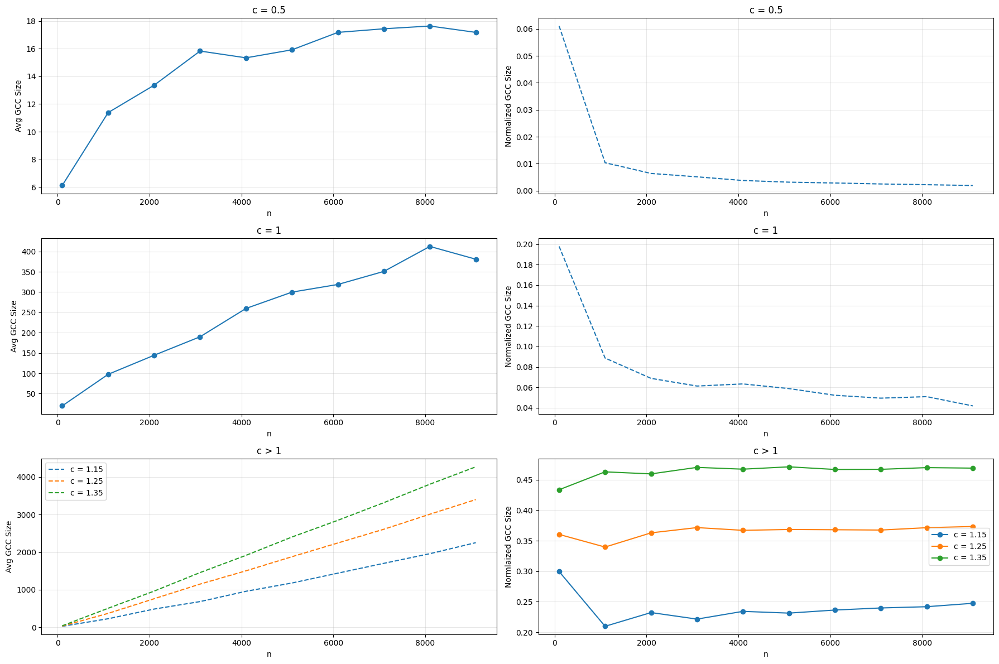

In [41]:
results = {}

n_values = list(range(100, 10001, 1000))

c_values = [0.5, 1, 1.15, 1.25, 1.35]

plt.figure(figsize=(18, 12))

for c_idx, c in enumerate(c_values):
    print(f"\nAnalyzing GCC size for c = {c}:")

    results[c] = []
    avg_gcc_sizes = []
    normalized_avg_gcc_sizes = []

    for n in n_values:
        p = c / n
        total_gcc_size = 0

        for trial in range(num_trials):
            G = ig.Graph.Erdos_Renyi(n=n, p=p)

            clusters = G.clusters()
            gcc_size = max(len(cluster) for cluster in clusters)
            total_gcc_size += gcc_size

        avg_gcc_size = total_gcc_size / num_trials
        normalized_avg_gcc_size = avg_gcc_size / n

        results[c].append({
            'n': n,
            'p': p,
            'avg_gcc_size': avg_gcc_size,
            'normalized_avg_gcc_size': normalized_avg_gcc_size
        })

        avg_gcc_sizes.append(avg_gcc_size)
        normalized_avg_gcc_sizes.append(normalized_avg_gcc_size)

        if n % 100 == 0:
          print(f"n = {n}, p = {p:.6f}, Avg GCC size = {avg_gcc_size:.2f} ({normalized_avg_gcc_size*100:.2f}%)")

    if c_idx < 2:
        plt.subplot(3, 2, 2*c_idx+1)
        plt.plot(n_values, avg_gcc_sizes, 'o-', label=f'c = {c}')
        plt.xlabel('n')
        plt.ylabel('Avg GCC Size')
        plt.title(f'c = {c}')
        plt.grid(True, alpha=0.3)

        plt.subplot(3, 2, 2*c_idx+2)
        plt.plot(n_values, normalized_avg_gcc_sizes, '--', label=f'c = {c}')
        plt.xlabel('n')
        plt.ylabel('Normalized GCC Size')
        plt.title(f'c = {c}')
        plt.grid(True, alpha=0.3)

c_values_gt1 = [c for c in c_values if c > 1]
if c_values_gt1:
    plt.subplot(3, 2, 5)
    for c in c_values_gt1:
        avg_sizes = [result['avg_gcc_size'] for result in results[c]]
        plt.plot(n_values, avg_sizes, '--', label=f'c = {c}')

    plt.xlabel('n')
    plt.ylabel('Avg GCC Size')
    plt.title('c > 1')
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.subplot(3, 2, 6)
    for c in c_values_gt1:
        normalized_sizes = [result['normalized_avg_gcc_size'] for result in results[c]]
        plt.plot(n_values, normalized_sizes, 'o-', label=f'c = {c}')

    plt.xlabel('n')
    plt.ylabel('Normlaized GCC Size')
    plt.title('c > 1')
    plt.legend()
    plt.grid(True, alpha=0.3)

plt.tight_layout()

Report:

* i. c = 0.5:

  The average size of the GCC grows as the n is growing and for larger ns, the slop is getting smaller. This matches the theoretical prediction that no giant component exists when c < 1 (the critical threshold), and the largest component size is O(log n), which grows much slower than n. As a result, we see that the normalized GCC size is getting zero.

* ii. c = 1:

  The normalized GCC size approaches 0 as n increases, but more slowly than for c = 0.5. Also, in the average gcc size plot, the large slope growing when n is small doesn’t exist, compared to the curve when c = 0.5.

* iii. c = 1.15, 1.25, 1.35:

 The normalized GCC size approaches a positive constant as n increases. Therefore, with a larger C, GCC has larger size. Also, the approaching normalized GCC size depends on c, which is the probability that a randomly chosen node belongs to the giant component.

* iv.

  c < 1: GCC size grows logarithmically.

  c = 1: GCC size grows sublinearly.

  c > 1: Normalized GCC and average GCC size approaches a positive constant that depends on c.

  Summary: as c increases, the relationship between GCC size and n become more linear, and also GCC size itself is larger

## 2 - Create networks using a preferential attachment model

### (a)

In [88]:
def get_connected_prob(n, m, num_trials):
  connected_count = 0
  for trial in range(num_trials):
      g = ig.Graph.Barabasi(n=n, m=m)

      if g.is_connected():
          connected_count += 1

  connectivity_prob = connected_count / num_trials
  print(f"Probability of connectivity: {connectivity_prob}")

In [43]:
n = 1050
m = 1
num_trials = 100

get_connected_prob(n, m, num_trials)

Probability of connectivity: 1.0


Report:

In the preferential attachment model, we begin with a small connected component and a new node adds exactly one edge connecting to an existing node. As a result, there cannot be a node added that is not connected to any other nodes.

The empirical results also confirm this.

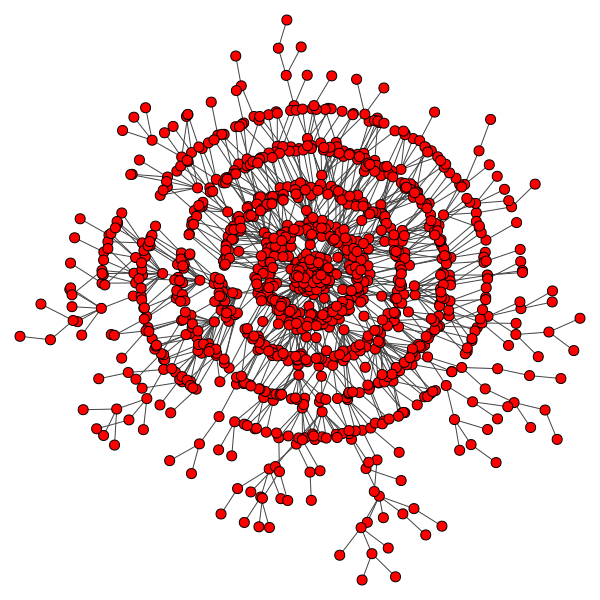

In [45]:
g = ig.Graph.Barabasi(n=1050, m=1)

layout = g.layout("kk")

ig.plot(
    g,
    layout=layout,
    vertex_size=10,
    vertex_label=None,
    edge_arrow_size=0.5,
    bbox=(600, 600)
)

### (b)

In [31]:
n = 1050
m = 1

graph = ig.Graph.Barabasi(n=n, m=m)
community = graph.community_fastgreedy()
clusters = community.as_clustering()
modularity = graph.modularity(clusters.membership)
assortativity = graph.assortativity_degree()

In [21]:
def plot_clusters(clusters, n, m):
  fig, ax = plt.subplots(figsize=(10,10))

  num_clusters = len(clusters)
  palette1 = ig.RainbowPalette(n=num_clusters)

  ax.set_title(f"Clusters Structure, n = {n}, m = {m}")

  ig.plot(
      clusters,
      target=ax,
      palette=palette1,
      vertex_size=2,
      edge_width=0.5,
      mark_groups = True
  )

  plt.show()

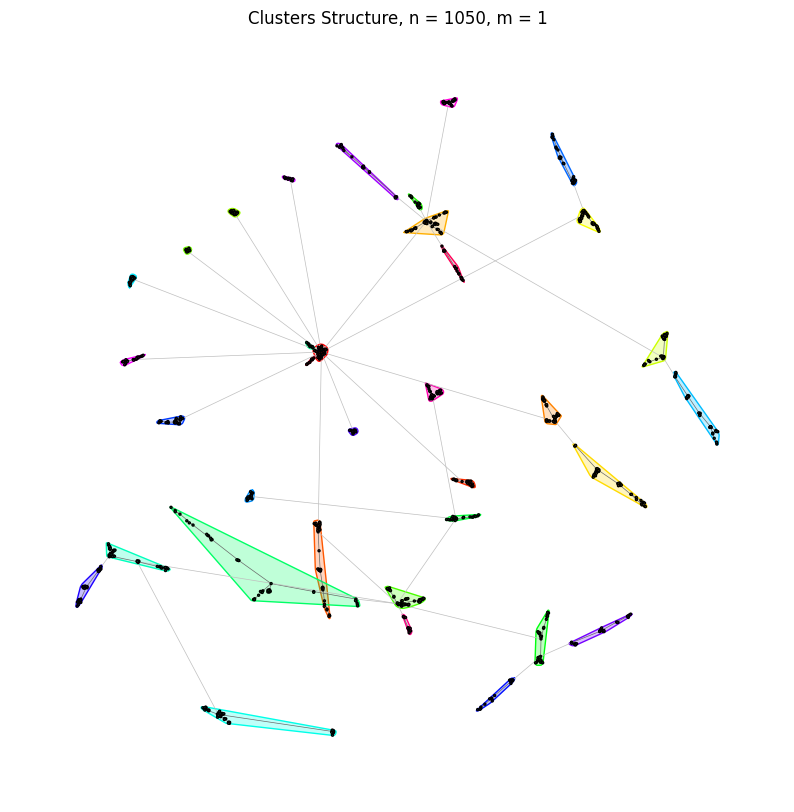

In [33]:
plot_clusters(clusters, n, m)

In [32]:
print(f"Number of communities: {len(clusters)}")
print(f"Modularity: {modularity}")
print(f"Assortativity: {assortativity}")

Number of communities: 35
Modularity: 0.9321992619054326
Assortativity: -0.03945417768604918


Report:

* The definition of assortativity is a measure of the tendency of nodes to

  connect to other nodes that are similar to themselves in some property (in this case, degree). Assortativity ranges from -1 to 1, where values close to 1
  indicate assortativity and values close to -1 indicate disassortativity.

  Mathematically, degree assortativity is defined as the Pearson correlation coefficient of degrees at either end of an edge. It can be represented by:

  $ q_i = \sum_j e_{ij}$

  $\text{Assortativity} = \frac{1}{\sigma_q^2}\sum_{jk}jk(e_{jk} - q_jq_k)$

  Where $\sigma_q^2$ is the variance over q, and $q_i$ measures the fraction of vertices connecting type i and type j, which in your case measures the fraction of vertices connecting with degree type i to type j.

  The modularity formula is:

  $\text{Modularity}(\text{Cluster}_i) = \sum_{i,j\in\text{Cluster}_i}A_{ij} - \frac{k_ik_j}{2m}$

  Where A is the adjacency matrix, m is the total number of edges in the graph, and k is the node degree.

* From the code: Modularity: 0.932354659801291,
Assortativity: -0.09317463445255016

  The negative value of assortativity indicates disassortative mixing and shows new nodes (with degree 1) connect to existing nodes with higher degrees.

### (c)

In [34]:
n = 10500
m = 1

graph_large = ig.Graph.Barabasi(n=n, m=m)
community = graph_large.community_fastgreedy()
clusters = community.as_clustering()
modularity = graph_large.modularity(clusters.membership)
assortativity = graph_large.assortativity_degree()

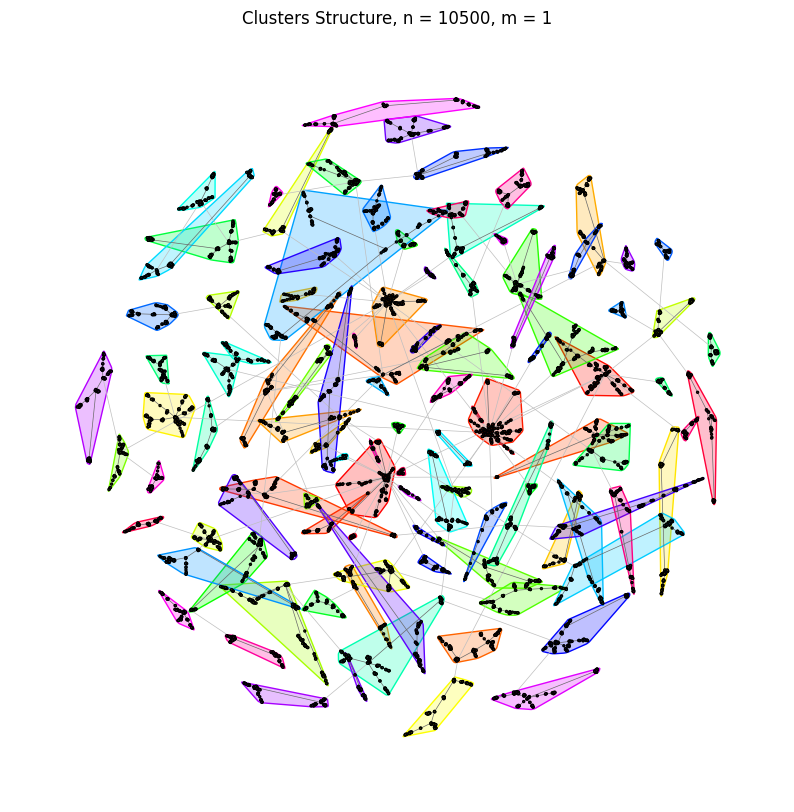

In [35]:
plot_clusters(clusters, n, m)

In [37]:
print(f"Number of communities: {len(clusters)}")
print(f"Modularity: {modularity}")
print(f"Assortativity: {assortativity}")

Number of communities: 107
Modularity: 0.9784061138320581
Assortativity: -0.019636698032891354


Report:

* Number of Communities:
The number of communities increased from 35 to 113.

* Modularity:
Both networks show high modularity values which indicates well-defined community structures. The larger network has higher modularity. This is because, in larger networks, there is a greater number of communities clustered together, as a result of having a higher number of nodes with higher degrees.  It also indicates fewer relationships between nodes of different degrees than in the small graph. This is because as the number of nodes increases, the number of nodes in smaller communities increases as well.

* Assortativity:
Both networks show negative assortativity. The assortativity becomes less negative in the larger network. Therefore, high-degree hubs connect to many low-degree nodes. In the large graph, there are more nodes and node edge
formation probability is proportional to degree. As a result, the large degree nodes get larger by connecting to low-degree nodes.

### (d)

In [41]:
def analyze_degree_distribution(g, network_size, is_degree=False):
    if is_degree:
        degrees = g
    else:
      degrees = g.degree()
    degree_counts = Counter(degrees)
    unique_degrees = sorted(degree_counts.keys())
    frequencies = [degree_counts[d] for d in unique_degrees]
    probabilities = [freq/network_size for freq in frequencies]
    x_values, y_values = [], []
    for d, p in zip(unique_degrees, probabilities):
        if p > 0 and d > 0:
            x_values.append(d)
            y_values.append(p)
    log_x = np.log10(x_values)
    log_y = np.log10(y_values)
    slope, intercept, r_value, p_value, std_err = stats.linregress(log_x, log_y)
    return x_values, y_values, slope, r_value**2, intercept

n = 1050: Power-law exponent = 2.158, R^2 = 0.876
n = 10500: Power-law exponent = 2.349, R^2 = 0.915


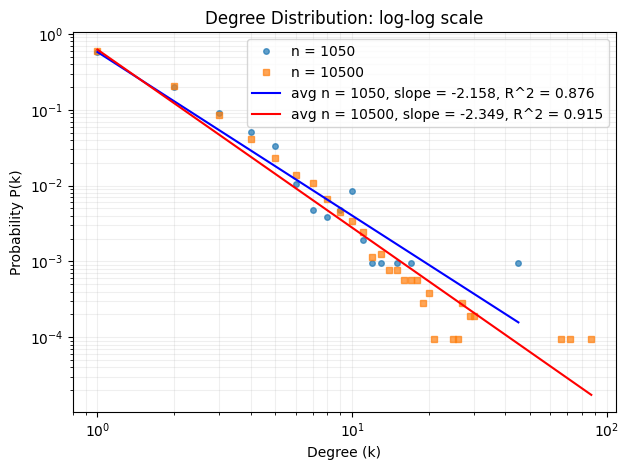

In [45]:
n1, n2 = 1050, 10500

x1, y1, slope1, r2_1, intercept1 = analyze_degree_distribution(graph, n1)
x2, y2, slope2, r2_2, intercept2 = analyze_degree_distribution(graph_large, n2)

plt.figure()
plt.loglog(x1, y1, 'o', markersize=4, alpha=0.7, label=f'n = {n1}')
plt.loglog(x2, y2, 's', markersize=4, alpha=0.7, label=f'n = {n2}')

x1_range = np.logspace(np.log10(min(x1)), np.log10(max(x1)), 100)
y1_pred = 10**(np.log10(x1_range) * slope1 + intercept1)
plt.loglog(x1_range, y1_pred, '-', color='blue',
           label=f'avg n = {n1}, slope = {slope1:.3f}, R^2 = {r2_1:.3f}')

x2_range = np.logspace(np.log10(min(x2)), np.log10(max(x2)), 100)
y2_pred = 10**(np.log10(x2_range) * slope2 + intercept2)
plt.loglog(x2_range, y2_pred, '-', color='red',
           label=f'avg n = {n2}, slope = {slope2:.3f}, R^2 = {r2_2:.3f}')

plt.xlabel('Degree (k)')
plt.ylabel('Probability P(k)')
plt.title('Degree Distribution: log-log scale')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.tight_layout()

print(f"n = {n1}: Power-law exponent = {-slope1:.3f}, R^2 = {r2_1:.3f}")
print(f"n = {n2}: Power-law exponent = {-slope2:.3f}, R^2 = {r2_2:.3f}")

### (e)

In [47]:
def sample_neighbor_degrees(g, num_samples=10000):
    neighbor_degrees = []

    for _ in range(num_samples):
        node_i = random.randint(0, g.vcount()-1)

        neighbors = g.neighbors(node_i)

        if not neighbors:
            continue

        node_j = random.choice(neighbors)

        degree_j = g.degree(node_j)
        neighbor_degrees.append(degree_j)

    return neighbor_degrees

neighbor_degrees = sample_neighbor_degrees(graph)
neighbor_degrees_large = sample_neighbor_degrees(graph_large)

In [50]:
def plot_degree_dist_comparison(graph, graph_large,neighbor_degrees, neighbor_degrees_large, n1, n2):
  x1_reg, y1_reg, slope1_reg, r2_1_reg, intercept1_reg = analyze_degree_distribution(graph, n1)
  x1_nei, y1_nei, slope1_nei, r2_1_nei, intercept1_nei = analyze_degree_distribution(neighbor_degrees, n1, is_degree=True)

  x2_reg, y2_reg, slope2_reg, r2_2_reg, intercept2_reg = analyze_degree_distribution(graph_large, n2)
  x2_nei, y2_nei, slope2_nei, r2_2_nei, intercept2_nei = analyze_degree_distribution(neighbor_degrees_large, n2, is_degree=True)

  print(f"n = {n1}: Regular degree distribution: Power-law exponent = {-slope1_reg:.3f}, R^2 = {r2_1_reg:.3f}")
  print(f"n = {n1}: Neighbor degree distribution: Power-law exponent = {-slope1_nei:.3f}, R^2 = {r2_1_nei:.3f}")
  print(f"n = {n2}: Regular degree distribution: Power-law exponent = {-slope2_reg:.3f}, R^2 = {r2_2_reg:.3f}")
  print(f"n = {n2}: Neighbor degree distribution: Power-law exponent = {-slope2_nei:.3f}, R^2 = {r2_2_nei:.3f}")

  plt.figure(figsize=(12, 10))

  plt.subplot(2, 1, 1)
  plt.loglog(x1_reg, y1_reg, 'o', markersize=4, alpha=0.7, label=f'Regular degree distribution')
  plt.loglog(x1_nei, y1_nei, 's', markersize=4, alpha=0.7, label=f'Neighbor degree distribution')

  x1_reg_range = np.logspace(np.log10(min(x1_reg)), np.log10(max(x1_reg)), 100)
  y1_reg_pred = 10**(slope1_reg * np.log10(x1_reg_range) + intercept1_reg)
  plt.loglog(x1_reg_range, y1_reg_pred, '-', color='blue',
            label=f'Regular slope = {slope1_reg:.3f}')

  x1_nei_range = np.logspace(np.log10(min(x1_nei)), np.log10(max(x1_nei)), 100)
  y1_nei_pred = 10**(slope1_nei * np.log10(x1_nei_range) + intercept1_nei)
  plt.loglog(x1_nei_range, y1_nei_pred, '-', color='red',
            label=f'Neighbor slope = {slope1_nei:.3f}')

  plt.xlabel('Degree (k)')
  plt.ylabel('Probability P(k)')
  plt.title(f'Degree Distributions n = {n1}: log-log scale')
  plt.legend()
  plt.grid(True, which="both", ls="-", alpha=0.2)

  plt.subplot(2, 1, 2)
  plt.loglog(x2_reg, y2_reg, 'o', markersize=4, alpha=0.7, label=f'Regular degree distribution')
  plt.loglog(x2_nei, y2_nei, 's', markersize=4, alpha=0.7, label=f'Neighbor degree distribution')

  x2_reg_range = np.logspace(np.log10(min(x2_reg)), np.log10(max(x2_reg)), 100)
  y2_reg_pred = 10**(slope2_reg * np.log10(x2_reg_range) + intercept2_reg)
  plt.loglog(x2_reg_range, y2_reg_pred, '-', color='blue',
            label=f'Regular slope = {slope2_reg:.3f}')

  x2_nei_range = np.logspace(np.log10(min(x2_nei)), np.log10(max(x2_nei)), 100)
  y2_nei_pred = 10**(slope2_nei * np.log10(x2_nei_range) + intercept2_nei)
  plt.loglog(x2_nei_range, y2_nei_pred, '-', color='red',
            label=f'Neighbor slope = {slope2_nei:.3f}')

  plt.xlabel('Degree (k)')
  plt.ylabel('Probability P(k)')
  plt.title(f'Degree Distributions n = {n2}: log-log scale')
  plt.legend()
  plt.grid(True, which="both", ls="-", alpha=0.2)

  plt.tight_layout()

n = 1050: Regular degree distribution: Power-law exponent = 2.158, R^2 = 0.876
n = 1050: Neighbor degree distribution: Power-law exponent = 1.102, R^2 = 0.611
n = 10500: Regular degree distribution: Power-law exponent = 2.349, R^2 = 0.915
n = 10500: Neighbor degree distribution: Power-law exponent = 1.334, R^2 = 0.717


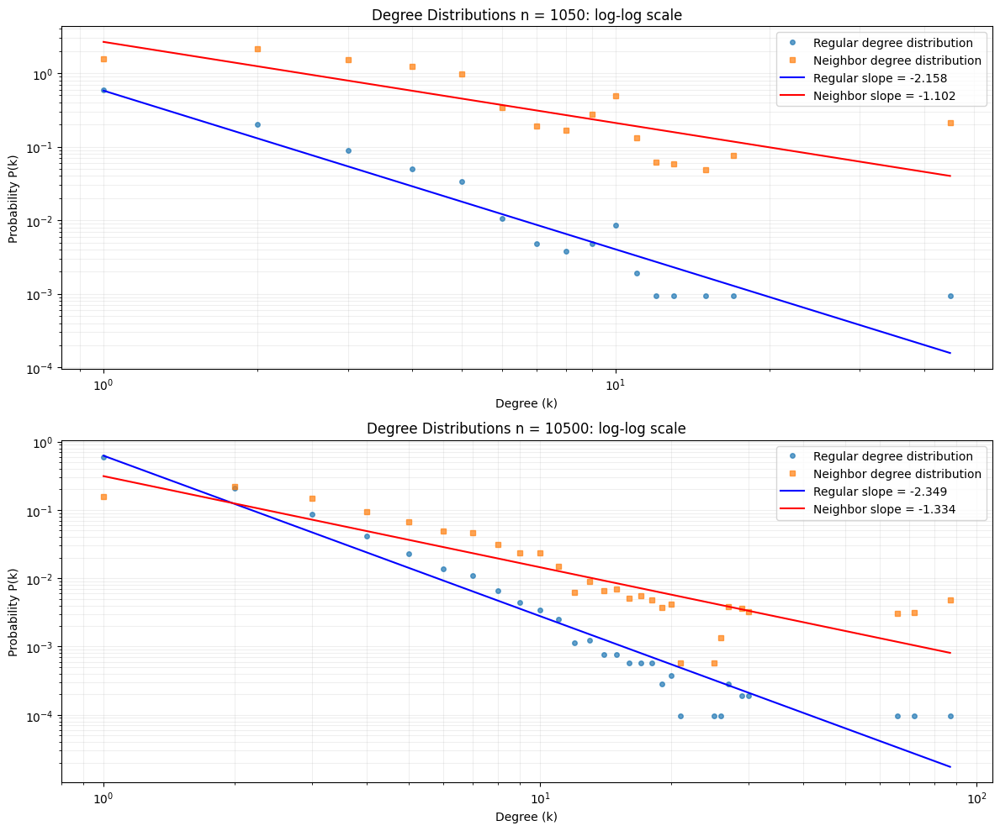

In [51]:
plot_degree_dist_comparison(graph, graph_large,neighbor_degrees, neighbor_degrees_large, n1, n2)

Report:

Is the distribution linear in the log-log scale? If so, what is the slope? How does this differ from the node degree distribution?

* The distribution is linear in log-log scale.

* Slopes:

  n = 1050: Regular degree distribution: slope: -2.158

  n = 1050: Neighbor degree distribution: slope: -1.102

  n = 10500: Regular degree distribution: slope: -2.349

  n = 10500: Neighbor degree distribution: slope: -1.334


  * The slope is smaller compared to the original degree distribution. The reason is that neighbor distribution gives more weight to high-degree nodes compared to the regular distribution. In other words, the neighbor sampling process biases to higher-degree nodes because they have more connections in the network.

### (f)

In [64]:
n = 1050
m = 1

def plot_degree_node_age(n, m, num_trials=100):
  degree_sums = np.zeros(n, dtype=float)

  for _ in range(num_trials):
      g = ig.Graph.Barabasi(n=n, m=m)
      degrees = g.degree()
      degree_sums += np.array(degrees)

  expected_degrees = degree_sums / num_trials
  node_ages = np.arange(n - 1, -1, -1)

  fig1 = plt.figure(figsize=(10, 6))
  plt.plot(node_ages, expected_degrees)
  plt.xlabel('Node Age')
  plt.ylabel('Expected Degree')
  plt.title(f'Expected Degree vs. Node Age, n={n}, m={m}')
  plt.grid(True)

  fig2 = plt.figure(figsize=(10, 6))
  plt.loglog(node_ages, expected_degrees)
  plt.xlabel('Node Age')
  plt.ylabel('Expected Degree')
  plt.title(f'Expected Degree vs. Node Age (Log-Log Scale), n={n}, m={m}')
  plt.grid(True, which="both", ls="-", alpha=0.2)

  return fig1, fig2, node_ages, expected_degrees

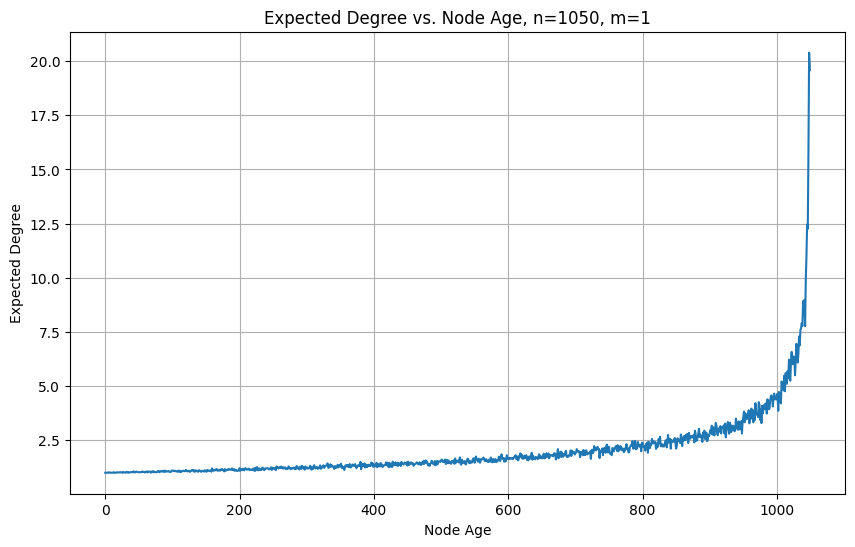

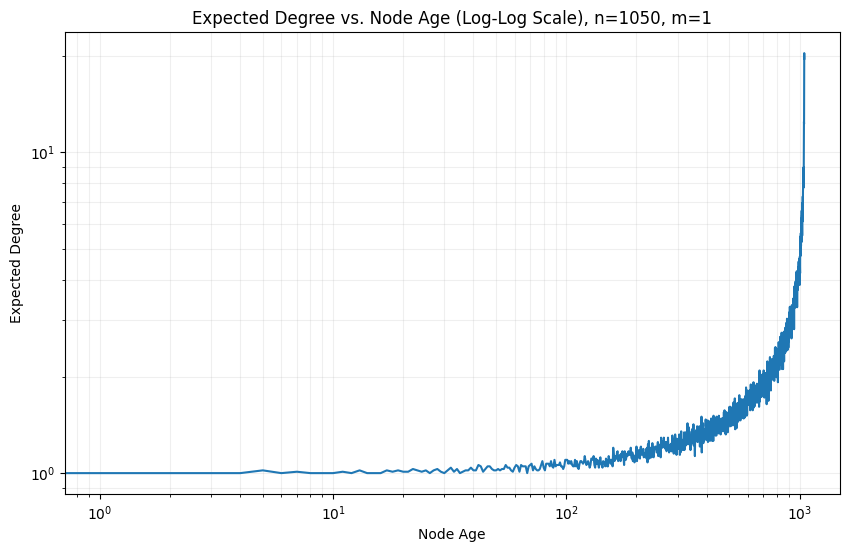

In [65]:
n = 1050
m = 1
fig1_m1, fig2_m1, node_ages_m1, expected_degrees_m1 = plot_degree_node_age(n, m)

Report:

* The newly added node will have the lowest degree, while the
oldest nodes will have the highest degree. Nodes with higher degrees are more likely to form new edges, therefore newer nodes will have a lower degree than older nodes.

### (g)

Repeat (a)

In [68]:
n = 1050
m = 2
num_trials = 100

get_connected_prob(n, m, num_trials)

Probability of connectivity: 1.0


In [69]:
n = 1050
m = 6
num_trials = 100

get_connected_prob(n, m, num_trials)

Probability of connectivity: 1.0


* Comparison: They are connected for m = 1, 2, 6.

Repeat (b)

In [70]:
n = 1050
m = 2

graph_m2 = ig.Graph.Barabasi(n=n, m=m)
community = graph_m2.community_fastgreedy()
clusters = community.as_clustering()
modularity = graph_m2.modularity(clusters.membership)
assortativity = graph_m2.assortativity_degree()

print(f"Number of communities: {len(clusters)}")
print(f"Modularity: {modularity}")
print(f"Assortativity: {assortativity}")

Number of communities: 21
Modularity: 0.5180448304899544
Assortativity: -0.04819514539480089


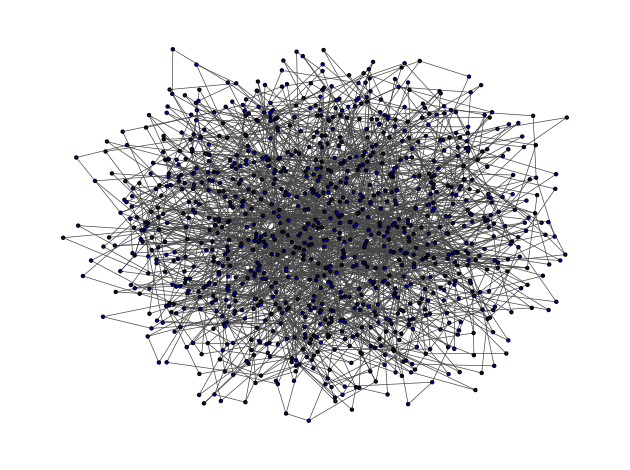

In [236]:
plot_graph(graph_m2)

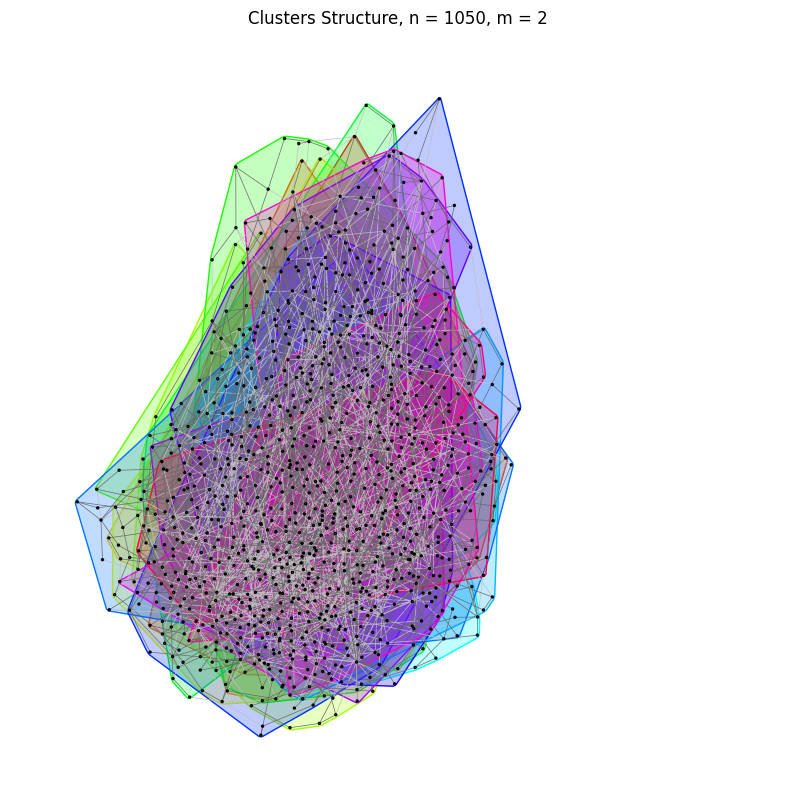

In [239]:
plot_clusters(clusters, n, m)

In [71]:
n = 1050
m = 6

graph_m6 = ig.Graph.Barabasi(n=n, m=m)
community = graph_m6.community_fastgreedy()
clusters = community.as_clustering()
modularity = graph_m6.modularity(clusters.membership)
assortativity = graph_m6.assortativity_degree()

print(f"Number of communities: {len(clusters)}")
print(f"Modularity: {modularity}")
print(f"Assortativity: {assortativity}")

Number of communities: 9
Modularity: 0.25244824834554574
Assortativity: -0.015788358851860095


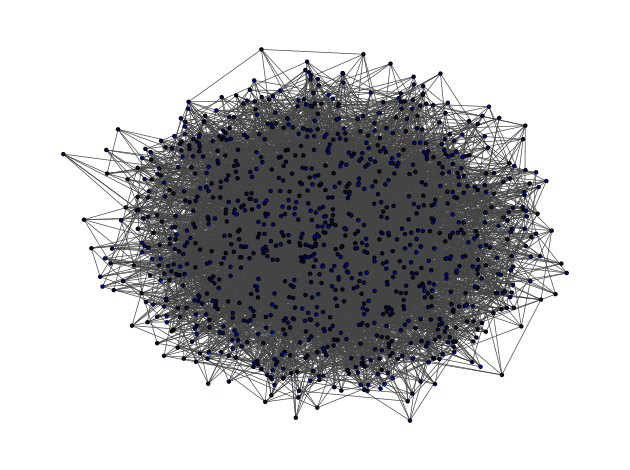

In [237]:
plot_graph(graph_m6)

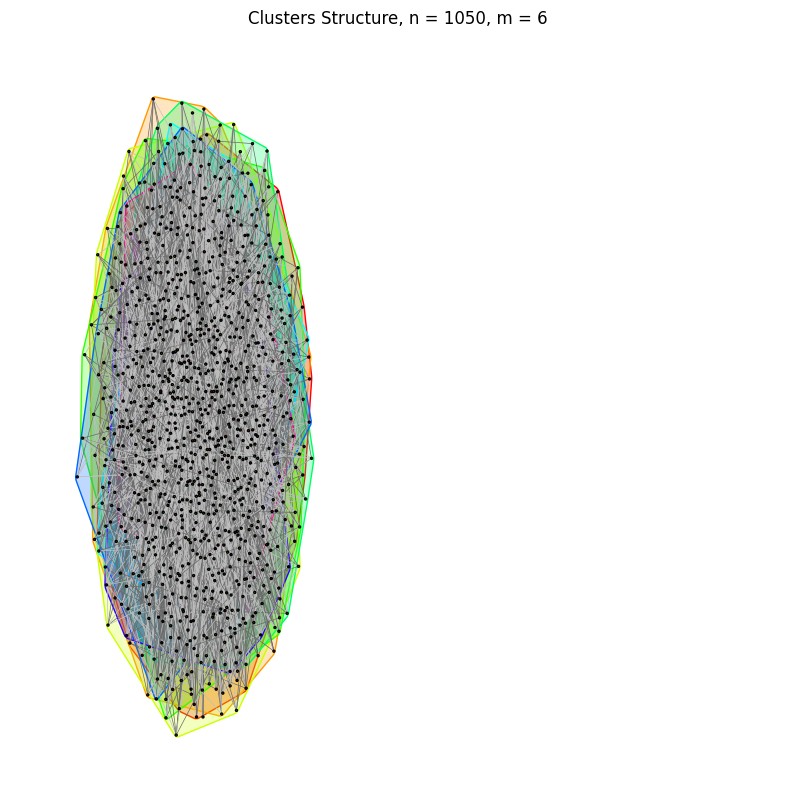

In [241]:
plot_clusters(clusters, n, m)

* Comparison: when m increases, the modularity decreases, and the assortativity score is near 0 when m is 6. Also, the number of clusters decreases.

Repeat (c):

In [72]:
n = 10500
m = 2

graph_m2_large = ig.Graph.Barabasi(n=n, m=m)
community = graph_m2_large.community_fastgreedy()
clusters = community.as_clustering()
modularity = graph_m2_large.modularity(clusters.membership)
assortativity = graph_m2_large.assortativity_degree()

print(f"Number of communities: {len(clusters)}")
print(f"Modularity: {modularity}")
print(f"Assortativity: {assortativity}")

Number of communities: 38
Modularity: 0.5312859019094504
Assortativity: -0.01438782863072277


In [73]:
n = 10500
m = 6

graph_m6_large = ig.Graph.Barabasi(n=n, m=m)
community = graph_m6_large.community_fastgreedy()
clusters = community.as_clustering()
modularity = graph_m6_large.modularity(clusters.membership)
assortativity = graph_m6_large.assortativity_degree()

print(f"Number of communities: {len(clusters)}")
print(f"Modularity: {modularity}")
print(f"Assortativity: {assortativity}")

Number of communities: 16
Modularity: 0.24887206506212492
Assortativity: -0.00468548724853711


* Comparison:
 When n increases with the same value of m, the modularity increases or is approximately equivalent.

  Assortativity score gets near 0 when n increases for the same m.

Repeat (d):

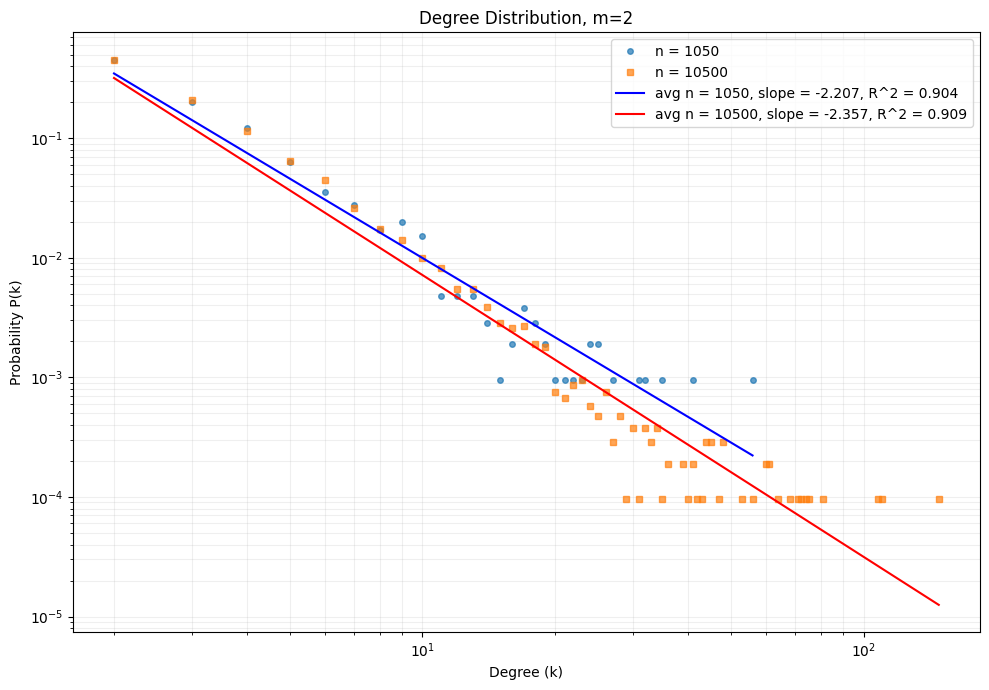

n = 1050: Power-law exponent = 2.207, R^2 = 0.904
n = 10500: Power-law exponent = 2.357, R^2 = 0.909


In [83]:
n1, n2 = 1050, 10500

x1, y1, slope1, r2_1, intercept1 = analyze_degree_distribution(graph_m2, 1050)
x2, y2, slope2, r2_2, intercept2 = analyze_degree_distribution(graph_m2_large, 10500)

plt.figure(figsize=(10, 7))
plt.loglog(x1, y1, 'o', markersize=4, alpha=0.7, label=f'n = {n1}')
plt.loglog(x2, y2, 's', markersize=4, alpha=0.7, label=f'n = {n2}')

x1_range = np.logspace(np.log10(min(x1)), np.log10(max(x1)), 100)
y1_pred = 10**(np.log10(x1_range) * slope1 + intercept1)
plt.loglog(x1_range, y1_pred, '-', color='blue',
           label=f'avg n = {n1}, slope = {slope1:.3f}, R^2 = {r2_1:.3f}')

x2_range = np.logspace(np.log10(min(x2)), np.log10(max(x2)), 100)
y2_pred = 10**(np.log10(x2_range) * slope2 + intercept2)
plt.loglog(x2_range, y2_pred, '-', color='red',
           label=f'avg n = {n2}, slope = {slope2:.3f}, R^2 = {r2_2:.3f}')

plt.xlabel('Degree (k)')
plt.ylabel('Probability P(k)')
plt.title(f'Degree Distribution, m={2}')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.tight_layout()
plt.savefig('degree_distribution.png')
plt.show()

print(f"n = {n1}: Power-law exponent = {-slope1:.3f}, R^2 = {r2_1:.3f}")
print(f"n = {n2}: Power-law exponent = {-slope2:.3f}, R^2 = {r2_2:.3f}")

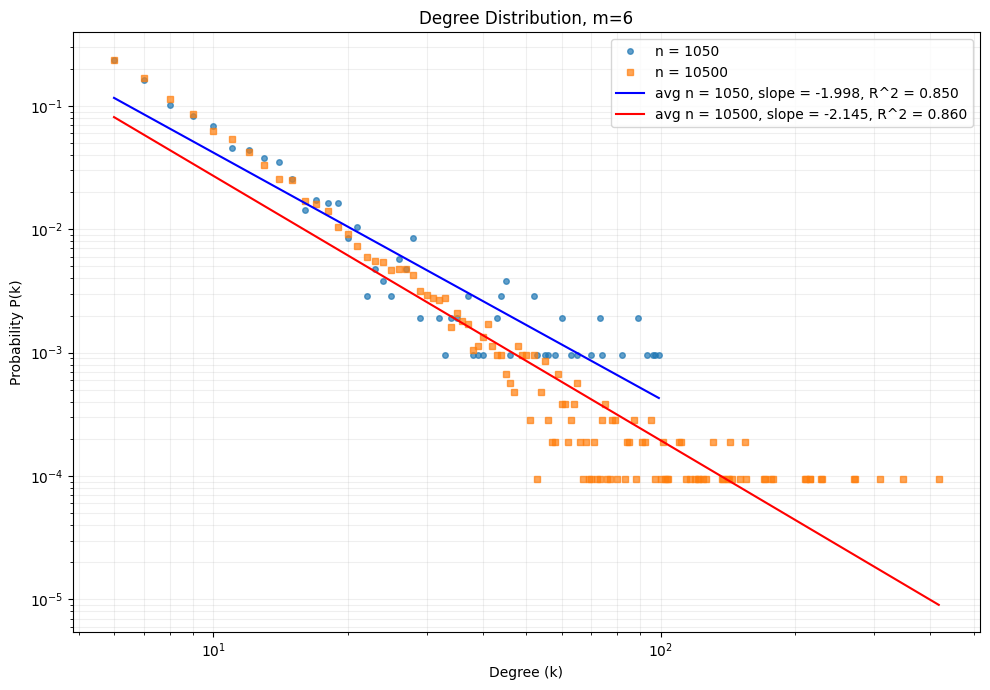

n = 1050: Power-law exponent = 1.998, R^2 = 0.850
n = 10500: Power-law exponent = 2.145, R^2 = 0.860


In [84]:
n1, n2 = 1050, 10500

x1, y1, slope1, r2_1, intercept1 = analyze_degree_distribution(graph_m6, 1050)
x2, y2, slope2, r2_2, intercept2 = analyze_degree_distribution(graph_m6_large, 10500)

plt.figure(figsize=(10, 7))
plt.loglog(x1, y1, 'o', markersize=4, alpha=0.7, label=f'n = {n1}')
plt.loglog(x2, y2, 's', markersize=4, alpha=0.7, label=f'n = {n2}')

x1_range = np.logspace(np.log10(min(x1)), np.log10(max(x1)), 100)
y1_pred = 10**(np.log10(x1_range) * slope1 + intercept1)
plt.loglog(x1_range, y1_pred, '-', color='blue',
           label=f'avg n = {n1}, slope = {slope1:.3f}, R^2 = {r2_1:.3f}')

x2_range = np.logspace(np.log10(min(x2)), np.log10(max(x2)), 100)
y2_pred = 10**(np.log10(x2_range) * slope2 + intercept2)
plt.loglog(x2_range, y2_pred, '-', color='red',
           label=f'avg n = {n2}, slope = {slope2:.3f}, R^2 = {r2_2:.3f}')

plt.xlabel('Degree (k)')
plt.ylabel('Probability P(k)')
plt.title(f'Degree Distribution, m={6}')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.tight_layout()
plt.savefig('degree_distribution.png')
plt.show()

print(f"n = {n1}: Power-law exponent = {-slope1:.3f}, R^2 = {r2_1:.3f}")
print(f"n = {n2}: Power-law exponent = {-slope2:.3f}, R^2 = {r2_2:.3f}")

* Comparison:
  When m increases, the slope value decreases.
  
  For each m, we observe the same trend when increasing n and the slope value gets higher.

Repeat (e):

n = 1050: Regular degree distribution: Power-law exponent = 2.207, R^2 = 0.904
n = 1050: Neighbor degree distribution: Power-law exponent = 1.164, R^2 = 0.747
n = 10500: Regular degree distribution: Power-law exponent = 2.357, R^2 = 0.909
n = 10500: Neighbor degree distribution: Power-law exponent = 1.366, R^2 = 0.749


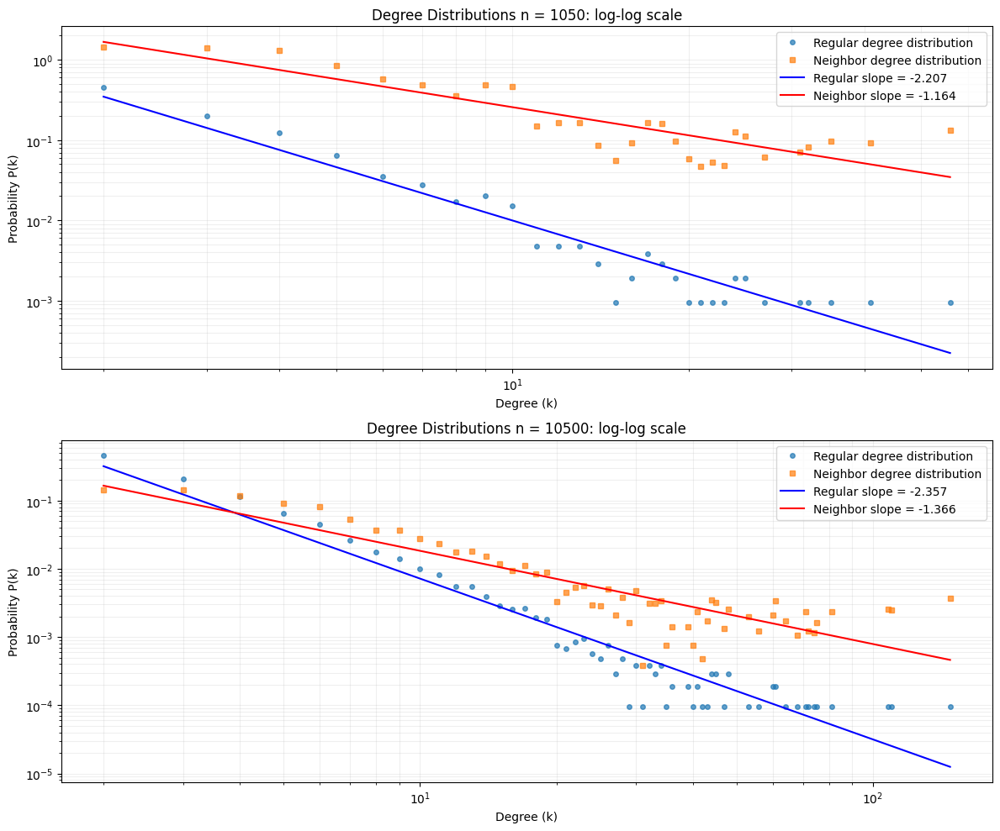

In [85]:
#m = 2
neighbor_degrees_m2 = sample_neighbor_degrees(graph_m2)
neighbor_degrees_large_m2 = sample_neighbor_degrees(graph_m2_large)
plot_degree_dist_comparison(graph_m2, graph_m2_large, neighbor_degrees_m2, neighbor_degrees_large_m2, n1, n2)

n = 1050: Regular degree distribution: Power-law exponent = 1.998, R^2 = 0.850
n = 1050: Neighbor degree distribution: Power-law exponent = 1.002, R^2 = 0.604
n = 10500: Regular degree distribution: Power-law exponent = 2.145, R^2 = 0.860
n = 10500: Neighbor degree distribution: Power-law exponent = 1.165, R^2 = 0.592


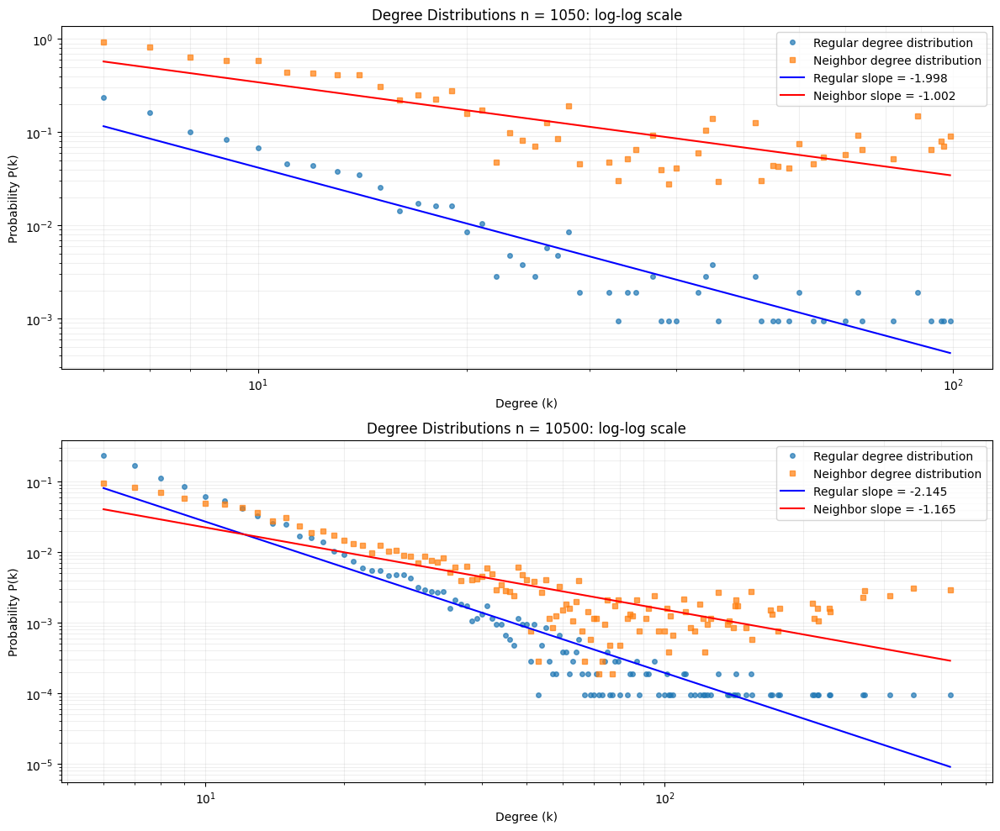

In [86]:
#m = 6
neighbor_degrees_m6 = sample_neighbor_degrees(graph_m6)
neighbor_degrees_large_m6 = sample_neighbor_degrees(graph_m6_large)
plot_degree_dist_comparison(graph_m6, graph_m6_large, neighbor_degrees_m6, neighbor_degrees_large_m6, n1, n2)

* Comparison: the slope value decreases when m increases.

  The neighbor distribution slopes values are less than regular degree distribution.

Repeat (f):

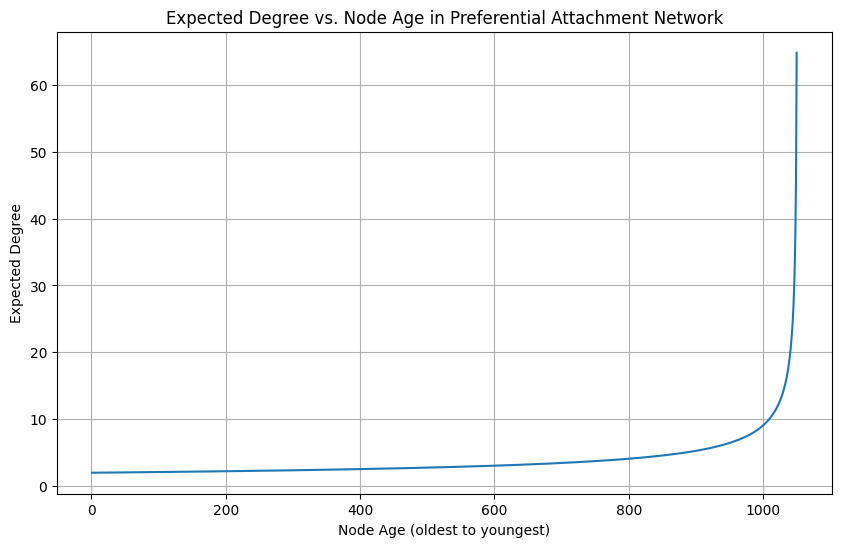

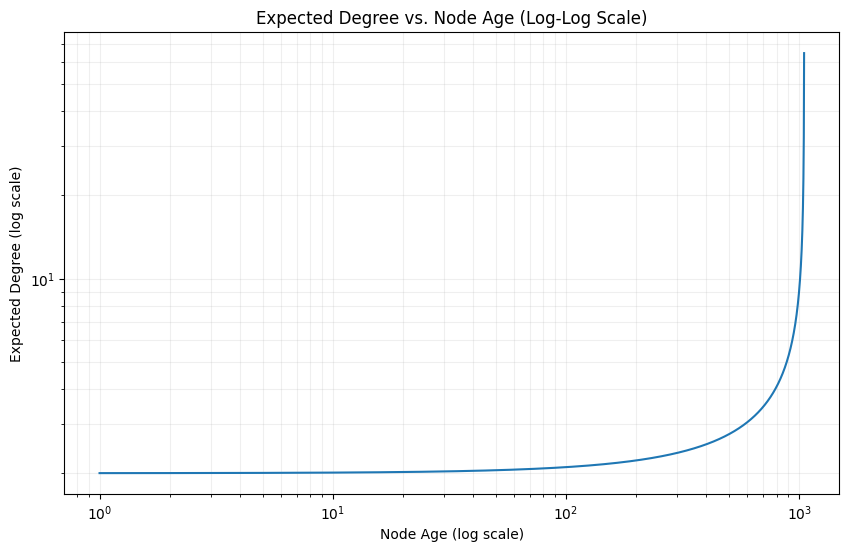

In [ ]:
n = 1050
m = 2
fig1_m2, fig2_m2, node_ages_m2, expected_degrees_m2 = plot_degree_node_age(n, m)

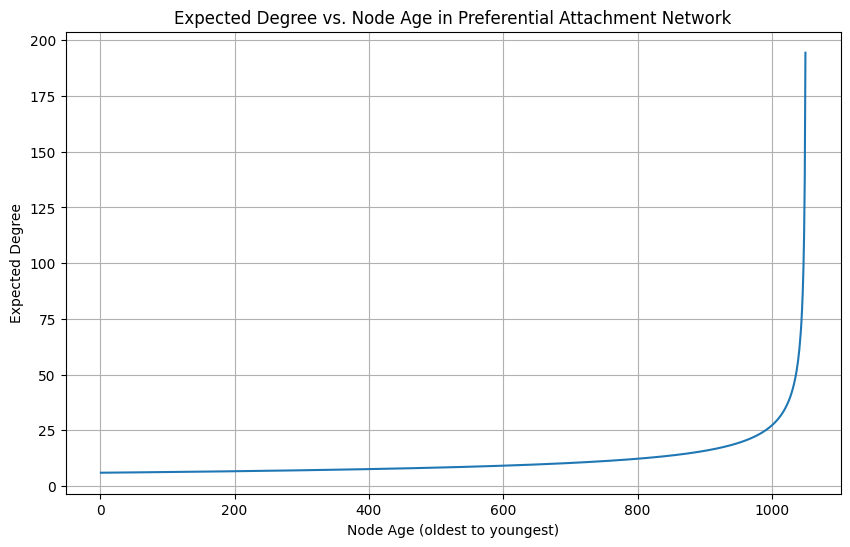

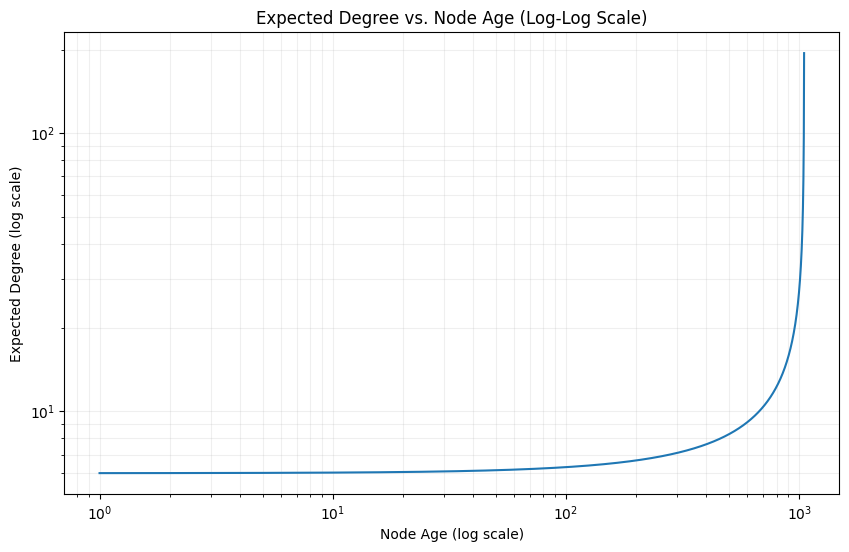

In [ ]:
n = 1050
m = 6
fig1_m6, fig2_m6, node_ages_m6, expected_degrees_m6 = plot_degree_node_age(n, m)

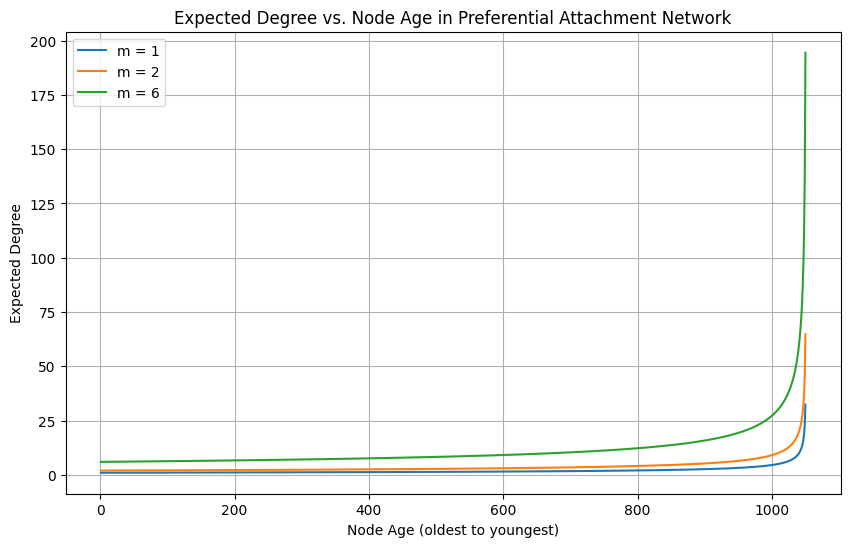

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(node_ages_m1, expected_degrees_m1, label='m = 1')
plt.plot(node_ages_m2, expected_degrees_m2, label='m = 2')
plt.plot(node_ages_m6, expected_degrees_m6, label='m = 6')
plt.xlabel('Node Age (oldest to youngest)')
plt.ylabel('Expected Degree')
plt.title('Expected Degree vs. Node Age in Preferential Attachment Network')
plt.legend()
plt.grid(True)

* Comparison: similar plots for different ms are achieved. The degree
increases in proportion to the increase in m. For m = 6, this increase is more significant.


Report:

Comparison:

(a) For all ms, all the connectivity probabilities are zero. Higher m values not only ensure connectivity but also create more robust networks that remain connected even if some nodes or edges are removed.

(b)
m = 1:
  Number of communities: 35,
  Modularity: 0.9346247413442916,
  Assortativity: -0.05961450512935464

m = 2:
  Number of communities: 20,
  Modularity: 0.5212652496049379,
  Assortativity: -0.07175589979164276

m = 6:
  Number of communities: 8,
  Modularity: 0.2509641202073533,
  Assortativity: -0.024679554247317825

Comparison:

Higher m values create more densely connected networks where community boundaries become less distinct

The network moves from strongly disassortative toward more neutral mixing

(c)
m = 1:
  Number of communities: 112
  Modularity: 0.9789208876164998
  Assortativity: -0.02691155007438092

m = 2:
  Number of communities: 37
  Modularity: 0.5297422942435239
  Assortativity: -0.013602256889502555

m = 6:
  Number of communities: 13
  Modularity: 0.2455220899911502
  Assortativity: -0.000622208237147565

(d)
m = 1:

n = 1050: Power-law exponent = 2.245, R² = 0.923

n = 10500: Power-law exponent = 2.581, R² = 0.942

m = 2:

n = 1050: Power-law exponent = 2.171, R² = 0.915

n = 10500: Power-law exponent = 2.310, R² = 0.895

m = 6:

n = 1050: Power-law exponent = 1.983, R² = 0.863

n = 10500: Power-law exponent = 2.154, R² = 0.872

(e)
m = 1:

n = 1050: Regular degree distribution: Power-law exponent = 1.960, R² = 0.823

n = 1050: Neighbor degree distribution: Power-law exponent = 0.953, R² = 0.555

n = 10500: Regular degree distribution: Power-law exponent = 2.155, R² = 0.881

n = 10500: Neighbor degree distribution: Power-law exponent = 1.189, R² = 0.666

m = 2:

n = 1050: Regular degree distribution: Power-law exponent = 2.171, R² = 0.915

n = 1050: Neighbor degree distribution: Power-law exponent = 1.094, R² = 0.722

n = 10500: Regular degree distribution: Power-law exponent = 2.310, R² = 0.895

n = 10500: Neighbor degree distribution: Power-law exponent = 1.286, R² = 0.744

m = 6:

n = 1050: Regular degree distribution: Power-law exponent = 1.983, R² = 0.863

n = 1050: Neighbor degree distribution: Power-law exponent = 0.976, R² = 0.570

n = 10500: Regular degree distribution: Power-law exponent = 2.154, R² = 0.872

n = 10500: Neighbor degree distribution: Power-law exponent = 1.181, R² = 0.628

(f) in the plots.


### (h)

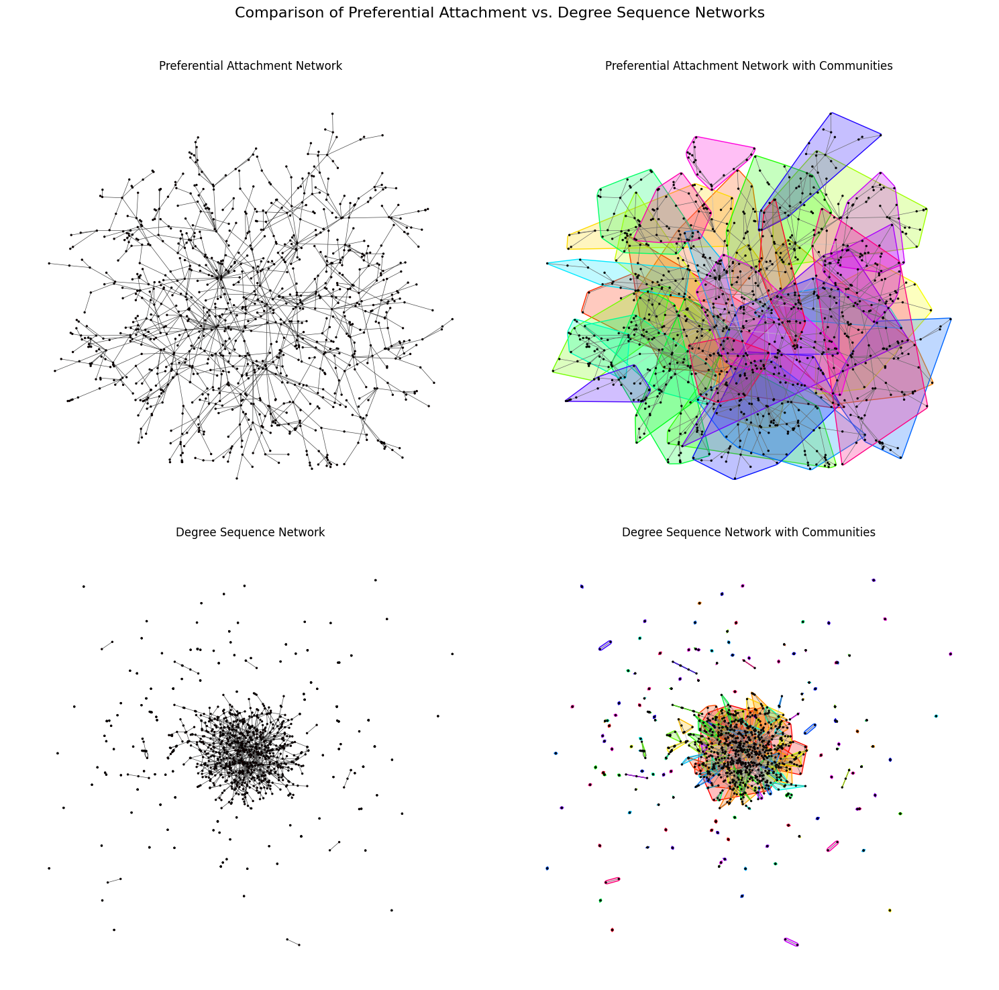

Preferential Attachment Model produced a connected graph
Modularity of PA graph: 0.9354412618672647
Assortativity: -0.07527845176248543
Degree Sequence Model did not produce a connected graph
Modularity of Degree Sequence graph: 0.7256945422623218
Assortativity: 0.05059897857174282


In [230]:
import igraph as ig
import matplotlib.pyplot as plt

graph_h = ig.Graph.Barabasi(n=1050, m=1, directed=False)

community_h = graph_h.community_fastgreedy()
clusters_h = community_h.as_clustering()

modularity_h = graph_h.modularity(clusters_h)

pa_assortativity_h = graph_h.assortativity_degree()

if graph_h.is_connected():
   conn_status_h = "Preferential Attachment Model produced a connected graph"
else:
   conn_status_h = "Preferential Attachment Model did not produce a connected graph"

degrees_h = graph_h.degree()
graph_h_2 = ig.Graph.Degree_Sequence(degrees_h, method="simple")

community_h_2 = graph_h_2.community_walktrap()
clusters_h_2 = community_h_2.as_clustering()

modularity_h_2 = graph_h_2.modularity(clusters_h_2)

pa_assortativity_h_2 = graph_h_2.assortativity_degree()

if graph_h_2.is_connected():
   conn_status_h_2 = "Degree Sequence Model produced a connected graph"
else:
   conn_status_h_2 = "Degree Sequence Model did not produce a connected graph"

fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Comparison of Preferential Attachment vs. Degree Sequence Networks', fontsize=16)

num_clusters_h = len(clusters_h)
num_clusters_h_2 = len(clusters_h_2)

palette_h = ig.RainbowPalette(n=num_clusters_h)
palette_h_2 = ig.RainbowPalette(n=num_clusters_h_2)

visual_style = {
   "vertex_size": 2,
   "vertex_label": None,
   "edge_width": 0.5,
   "target": axes[0, 0],
   "layout": graph_h.layout_fruchterman_reingold(niter=500)
}

ig.plot(graph_h, **visual_style)
axes[0, 0].set_title('Preferential Attachment Network')
axes[0, 0].axis('off')

visual_style["target"] = axes[0, 1]
visual_style["palette"] = palette_h
visual_style["mark_groups"] = True

ig.plot(clusters_h, **visual_style)
axes[0, 1].set_title('Preferential Attachment Network with Communities')
axes[0, 1].axis('off')

visual_style_2 = {
   "vertex_size": 2,
   "vertex_label": None,
   "edge_width": 0.5,
   "target": axes[1, 0],
   "layout": graph_h_2.layout_fruchterman_reingold(niter=500)
}

ig.plot(graph_h_2, **visual_style_2)
axes[1, 0].set_title('Degree Sequence Network')
axes[1, 0].axis('off')

visual_style_2["target"] = axes[1, 1]
visual_style_2["palette"] = palette_h_2
visual_style_2["mark_groups"] = True

ig.plot(clusters_h_2, **visual_style_2)
axes[1, 1].set_title('Degree Sequence Network with Communities')
axes[1, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('network_comparison.png', dpi=300)
plt.show()

print(conn_status_h)
print(f"Modularity of PA graph: {modularity_h}")
print(f"Assortativity: {pa_assortativity_h}")

print(conn_status_h_2)
print(f"Modularity of Degree Sequence graph: {modularity_h_2}")
print(f"Assortativity: {pa_assortativity_h_2}")

In [231]:
print(f"Modularity of PA graph: {modularity_h}")
print(f"Assortativity: {pa_assortativity_h}")

print(f"Modularity of Degree Sequence graph: {modularity_h_2}")
print(f"Assortativity: {pa_assortativity_h_2}")

print(f"PA Network - Connected: {graph_h.is_connected()}")
print(f"PA Network - Communities: {len(clusters_h)}")
print(f"PA Network - Modularity: {modularity_h:.4f}")
print(f"PA Network - Assortativity: {pa_assortativity_h:.4f}")

print(f"Degree Sequence - Connected: {graph_h_2.is_connected()}")
print(f"Degree Sequence - Communities: {len(clusters_h_2)}")
print(f"Degree Sequence - Modularity: {modularity_h_2:.4f}")
print(f"Degree Sequence - Assortativity: {pa_assortativity_h_2:.4f}")

Modularity of PA graph: 0.9354412618672647
Assortativity: -0.07527845176248543
Modularity of Degree Sequence graph: 0.7256945422623218
Assortativity: 0.05059897857174282
PA Network - Connected: True
PA Network - Communities: 35
PA Network - Modularity: 0.9354
PA Network - Assortativity: -0.0753
Degree Sequence - Connected: False
Degree Sequence - Communities: 209
Degree Sequence - Modularity: 0.7257
Degree Sequence - Assortativity: 0.0506


* The original graph is fully connected, but the matched graph
has a ring of isolated nodes that are not connected surrounding the GCC.

* Matched graph has lower modularity.

## 3-Create a modified preferential attachment model that penalizes the age of a node

### (a)

In [127]:
def generate_age_penalized_pa_network(n, m, alpha, beta, a, b, c, d):
    g = ig.Graph.Full(m+1)

    for i in range(m+1, n):
        degrees = g.degree()
        ages = [i - j for j in range(len(g.vs))]

        probs = [(c * (k ** alpha) + a) * (d * (l ** beta) + b) for k, l in zip(degrees, ages)]

        probs = [p/sum(probs) for p in probs]

        targets = np.random.choice(range(len(g.vs)), size=m, replace=False, p=probs)
        new_id = g.vcount()
        g.add_vertices(1)

        for target in targets:
            g.add_edges([(new_id, target)])

    return g

In [128]:
n = 1050
m = 1
alpha = 1
beta = -1
a = c = d = 1
b = 0

ap_pa_graph = generate_age_penalized_pa_network(n, m, alpha, beta, a, b, c, d)

degrees = ap_pa_graph.degree()
degree_counts = Counter(degrees)

degree_probs = {}
for d in degree_counts:
    degree_probs[d] = degree_counts[d] / n

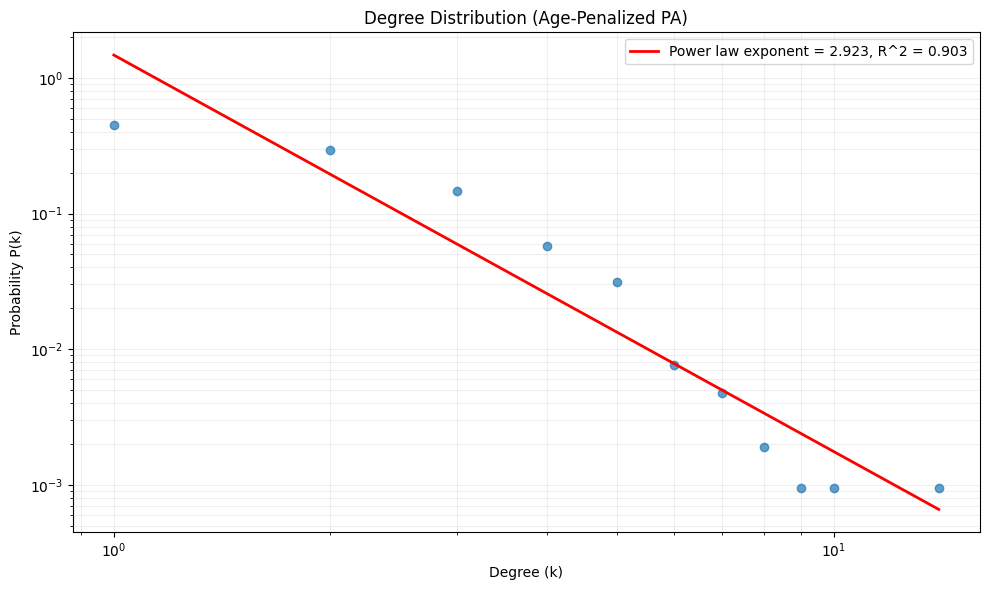

Power law exponent: 2.923
R-squared: 0.903


In [129]:
plt.figure(figsize=(10, 6))
degrees_x = list(degree_probs.keys())
probs_y = list(degree_probs.values())

x_values = []
y_values = []
for d, p in zip(degrees_x, probs_y):
    if d > 0 and p > 0:
        x_values.append(d)
        y_values.append(p)

plt.loglog(x_values, y_values, 'o', markersize=6, alpha=0.7)

log_x = np.log10(x_values)
log_y = np.log10(y_values)
slope, intercept, r_value, p_value, std_err = stats.linregress(log_x, log_y)

x_fit = np.logspace(np.log10(min(x_values)), np.log10(max(x_values)), 100)
y_fit = 10**(intercept + slope*np.log10(x_fit))
plt.loglog(x_fit, y_fit, 'r-', linewidth=2,
           label=f'Power law exponent = {-slope:.3f}, R^2 = {r_value**2:.3f}')

plt.xlabel('Degree (k)')
plt.ylabel('Probability P(k)')
plt.title('Degree Distribution (Age-Penalized PA)')
plt.legend()
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.tight_layout()
plt.show()

print(f"Power law exponent: {-slope:.3f}")
print(f"R-squared: {r_value**2:.3f}")

* It still follows the power law and the power law exponent is 2.923.

* Power law degree distribution occurs where $P(k) = c(k_{max}, \gamma) k^{-\gamma}$

  Preferential attachment model typically has a degree distribution that follows a power law with an exponent of -3. This exponent, represented as $\gamma$, is defined in the equation $y = ax^{\gamma}$.
  
  To determine the power law exponent, we can convert our degree $k$ distribution into a log-log plot and calculate the slope of the line that best fits the resulting graph.

  The slope of the linear fit is $-2.923$, so the power law exponent is $2.923$.
  
* The slope is approximately equivalent to: when $k \gg 1$, then $\lim_{k \to \infty} \frac{\alpha}{k^3} = k^{-3}$.
  
  
 * In theory, the power law exponent is $-3$, and our experimentally found power law exponent is close to that.

### (b)

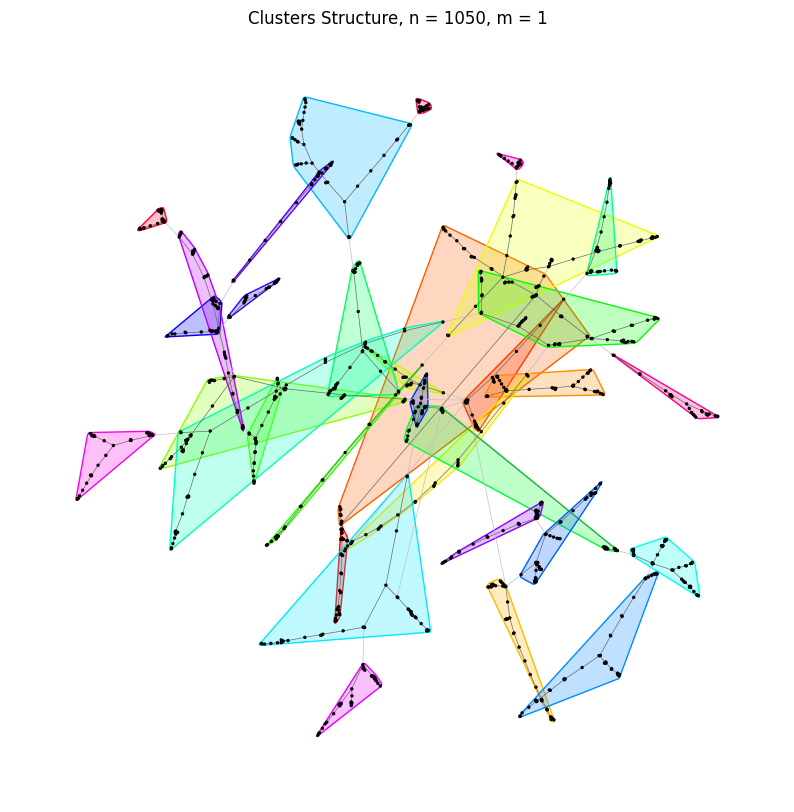

Modularity: 0.9370988394230827


In [130]:
communities  = ap_pa_graph.community_fastgreedy().as_clustering()
modularity = ap_pa_graph.modularity(communities)

plot_clusters(communities, n, m)

print(f"Modularity: {modularity}")

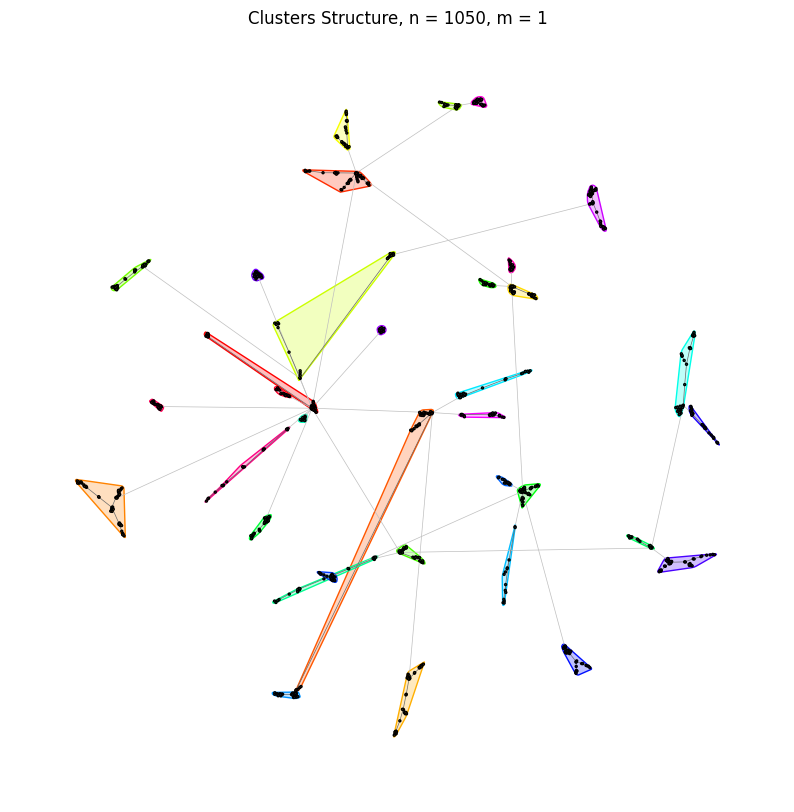

Modularity of regular pa: 0.9351268310370494


In [132]:
instance_graph = ig.Graph.Barabasi(n=n, m=m)

communities  = instance_graph.community_fastgreedy().as_clustering()
modularity = instance_graph.modularity(communities)

plot_clusters(communities, n, m)

print(f"Modularity of regular pa: {modularity}")

* In comparison with the original preferential graph, the modified version has denser connections between nodes within modules. Therefore, the modularity is higher.

# Random Walk on Networks

## 1-Random walk on ER networks

### (a)

In [133]:
n = 900
p = 0.015

graph = ig.Graph.Erdos_Renyi(n=n, p=p)

num_nodes = graph.vcount()
num_edges = graph.ecount()
avg_degree = 2 * num_edges / num_nodes

print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")
print(f"Average degree: {avg_degree:.2f}")

is_connected = graph.is_connected()
print(f"Is the graph connected? {is_connected}")

Number of nodes: 900
Number of edges: 6064
Average degree: 13.48
Is the graph connected? True


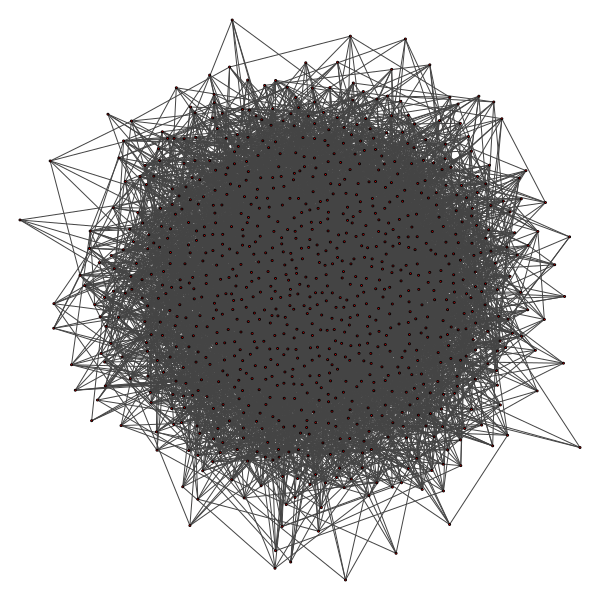

In [135]:
ig.plot(graph, vertex_size=2)

### (b)

In [136]:
def random_walk(graph, num_walks=100, walk_length=100):
    walk_indices = np.zeros(num_walks)
    path_lengths = np.zeros((num_walks, walk_length))
    destination_degrees = np.zeros((num_walks, walk_length))

    components = graph.clusters()
    giant_component = graph.subgraph(components.giant())

    for i in range(num_walks):
        walk_indices[i] = i+1

        for j in range(walk_length):
            origin_node = random.choice(giant_component.vs.indices)

            walk = giant_component.random_walk(origin_node, j)

            destination_node = walk[-1]

            path = giant_component.get_shortest_paths(origin_node, destination_node)
            current_path_length = len(path[0]) - 1

            degree = giant_component.degree(destination_node)

            path_lengths[i, j] = current_path_length
            destination_degrees[i, j] = degree

    return (walk_indices, path_lengths, destination_degrees)

In [146]:
def calculate_plot_avg_distance_stats(graph, num_walks=100, num_steps=100):
    distances = np.zeros((num_walks, num_steps))

    n = graph.vcount()

    for walk in range(num_walks):
        start_node = np.random.randint(0, n)

        path = random_walk(graph, start_node, num_steps)

        for step in range(num_steps):
            current_node = path[step]
            if current_node != start_node:
                distances[walk, step] = graph.shortest_paths(start_node, current_node)[0][0]
            else:
                distances[walk, step] = 0

    avg_distance = np.mean(distances, axis=0)
    var_distance = np.var(distances, axis=0)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(range(num_steps), avg_distance)
    plt.xlabel('Steps')
    plt.ylabel('Average Distance')
    plt.title('Average Distance from Starting Point')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(range(num_steps), var_distance)
    plt.xlabel('Steps')
    plt.ylabel('Variance')
    plt.title('Variance of Distance from Starting Point')
    plt.grid(True)

    plt.tight_layout()

    return avg_distance, var_distance

<ipython-input-146-8b885ad856dd>:14: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances[walk, step] = graph.shortest_paths(start_node, current_node)[0][0]


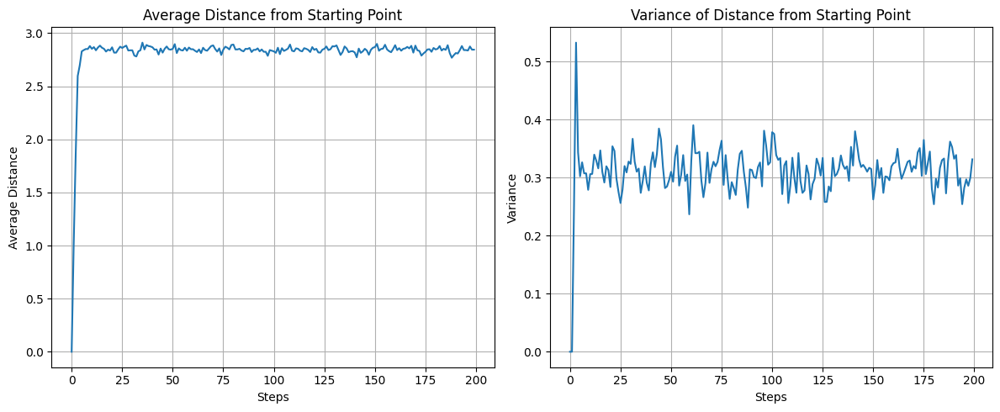

In [150]:
num_walks = 500
num_steps = 200

avg_distance, var_distance = calculate_plot_avg_distance_stats(graph, num_walks, num_steps)

In [154]:
print(f"Average Distance from Starting Point: {avg_distance[-1]:.2f}")
print(f"Variance of Distance from Starting Point: {var_distance[-1]:.2f}")

Average Distance from Starting Point: 2.84
Variance of Distance from Starting Point: 0.33


* It is observed that the variance of the average value of the shortest distance increases untill it covergs to a fixed value. The average is close to 2.8.

* The variance first increases, then it drops to ~ 0.3.

* We have performed 500 independent random walks on the graph. Each random walk consisted of 200 steps, which is sufficient to explore a good portion of this 900-node graph.

### (c)

In [155]:
def measure_degree_distribution(graph, num_walks, num_steps):
  n = graph.vcount()
  all_degrees = graph.degree()
  all_degree_counts = Counter(all_degrees)
  all_degree_dist = {d: count/n for d, count in all_degree_counts.items()}
  final_node_degrees = []

  for _ in range(num_walks):
      start_node = np.random.randint(0, n)
      path = random_walk(graph, start_node, num_steps)
      final_node = path[-1]
      final_node_degrees.append(graph.degree(final_node))

  final_degree_counts = Counter(final_node_degrees)
  final_degree_dist = {d: count/num_walks for d, count in final_degree_counts.items()}

  plt.figure(figsize=(10, 6))

  all_unique_degrees = sorted(set(all_degrees + final_node_degrees))

  x = np.array(all_unique_degrees)
  y1 = np.array([all_degree_dist.get(d, 0) for d in x])
  y2 = np.array([final_degree_dist.get(d, 0) for d in x])

  plt.bar(x - 0.2, y1, width=0.4, label='Overall Graph', alpha=0.7)
  plt.bar(x + 0.2, y2, width=0.4, label='Final Nodes of Random Walks', alpha=0.7)

  plt.xlabel('Degree')
  plt.ylabel('Probability')
  plt.title(f'Degree Distribution Comparison: n={n}')
  plt.legend()
  plt.grid(True, alpha=0.3)

  avg_all_degree = np.mean(all_degrees)
  avg_final_degree = np.mean(final_node_degrees)

  print(f"Average degree in overall graph: {avg_all_degree:.2f}")
  print(f"Average degree of nodes reached by random walks: {avg_final_degree:.2f}")

Average degree in overall graph: 13.48
Average degree of nodes reached by random walks: 14.01


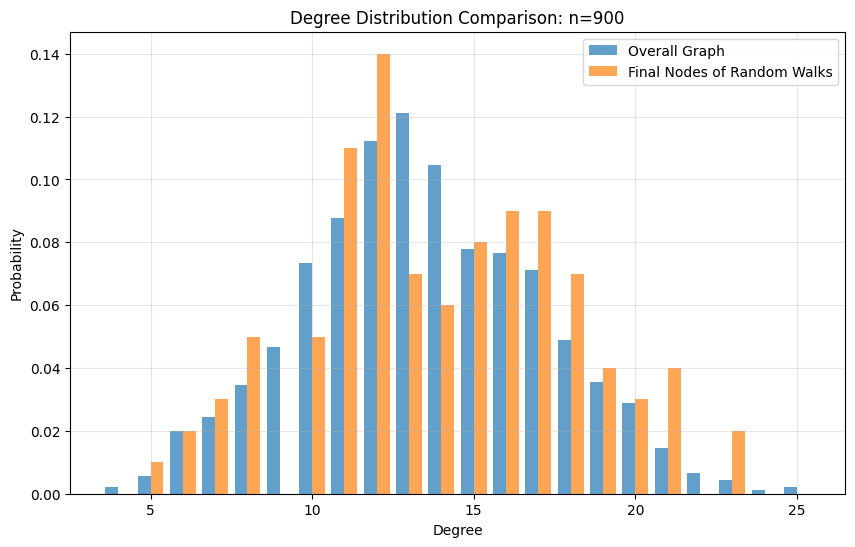

In [156]:
num_steps = 1000
num_walks = 100
measure_degree_distribution(graph, num_walks, num_steps)

Report:

* The average degree of nodes reached at the end of random walks is higher than the average degree of the overall graph. Also, we see the degree distribution of final nodes is shifted.  

* This observation happens because random walks visit high-degree nodes since there are more paths leading to them.

* They both have a similar binomial distribution expected for the random network.

### (d)

<ipython-input-146-8b885ad856dd>:14: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances[walk, step] = graph.shortest_paths(start_node, current_node)[0][0]


(array([0.    , 1.    , 1.97  , 2.085 , 2.0925, 2.115 , 2.1275, 2.095 ,
        2.1125, 2.1325, 2.1075, 2.1225, 2.1225, 2.1125, 2.125 , 2.0725,
        2.1125, 2.095 , 2.1225, 2.09  , 2.1075, 2.125 , 2.0875, 2.1275,
        2.08  , 2.125 , 2.125 , 2.1375, 2.1125, 2.1225, 2.0725, 2.1025,
        2.0975, 2.115 , 2.105 , 2.0875, 2.11  , 2.1   , 2.12  , 2.1325]),
 array([0.        , 0.        , 0.0441    , 0.142775  , 0.11894375,
        0.146775  , 0.13624375, 0.115975  , 0.11984375, 0.14994375,
        0.12594375, 0.12749375, 0.14249375, 0.12984375, 0.124375  ,
        0.12724375, 0.12484375, 0.115975  , 0.14749375, 0.1269    ,
        0.10594375, 0.139375  , 0.10984375, 0.13624375, 0.0986    ,
        0.134375  , 0.144375  , 0.15359375, 0.11484375, 0.13749375,
        0.12224375, 0.11699375, 0.14299375, 0.136775  , 0.123975  ,
        0.11984375, 0.1329    , 0.125     , 0.1356    , 0.14494375]))

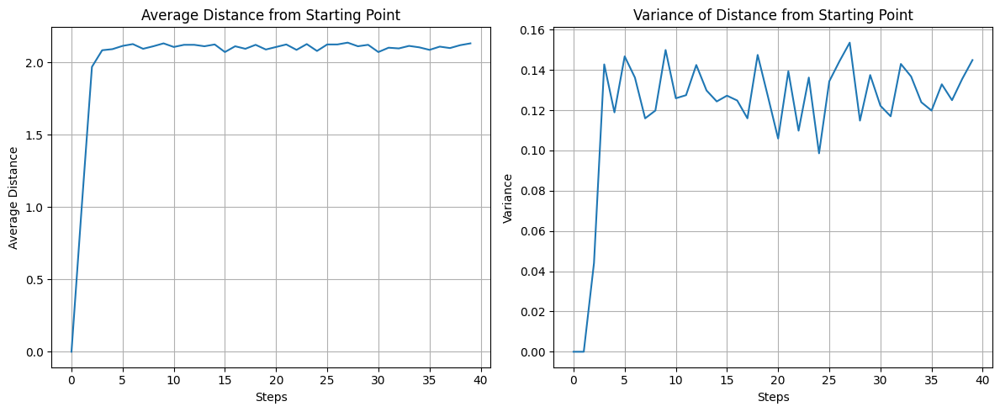

In [157]:
n = 9000
num_walks = 400
num_steps = 40

graph_large = ig.Graph.Erdos_Renyi(n=n, p=p)

avg_distance, var_distance = calculate_plot_avg_distance_stats(graph_large, num_walks, num_steps)

In [161]:
print(f"Average Distance from Starting Point: {avg_distance[-1]:.2f}")
print(f"Variance of Distance from Starting Point: {var_distance[-1]:.2f}")

Average Distance from Starting Point: 2.13
Variance of Distance from Starting Point: 0.14


In [163]:
diameter = graph.diameter()
diameter_large = graph_large.diameter()

print(f"Diameter of small network: {diameter}")
print(f"Diameter of large network: {diameter_large}")

Diameter of small network: 5
Diameter of large network: 3


* We see a smaller average distance for the larger networks. For the large network is converges to 2.13 while for the small network, it converges to 2.84.

  A larger network offers improved connectivity due to its smaller diameter, which in this case is 3. This smaller diameter results in shorter average paths between nodes.

* The variance has been decreased. Since the network is more concentrated,
we see the variance also decrease.

## 2- Random walk on networks with fat-tailed degree distribution

### (a)

In [177]:
n, m = 900, 1
graph = ig.Graph.Barabasi(n, m, directed=False)

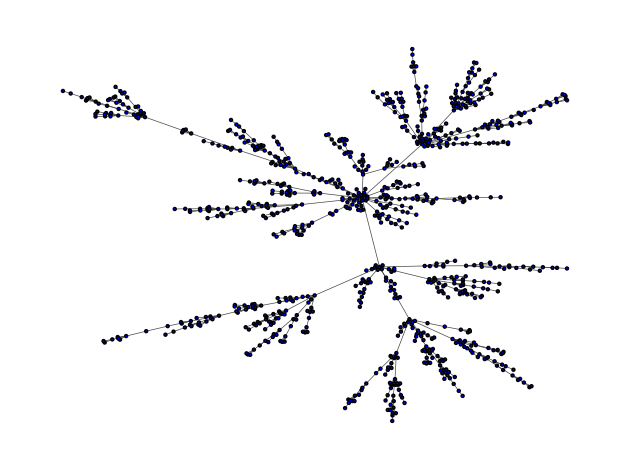

In [174]:
layout = graph.layout_fruchterman_reingold()
ig.plot(graph, layout=layout, vertex_size=3, edge_width=0.5,
        vertex_color="blue", target=plt.gca())

plt.axis('off')
plt.tight_layout()
plt.show()

### (b)

<ipython-input-146-8b885ad856dd>:14: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances[walk, step] = graph.shortest_paths(start_node, current_node)[0][0]


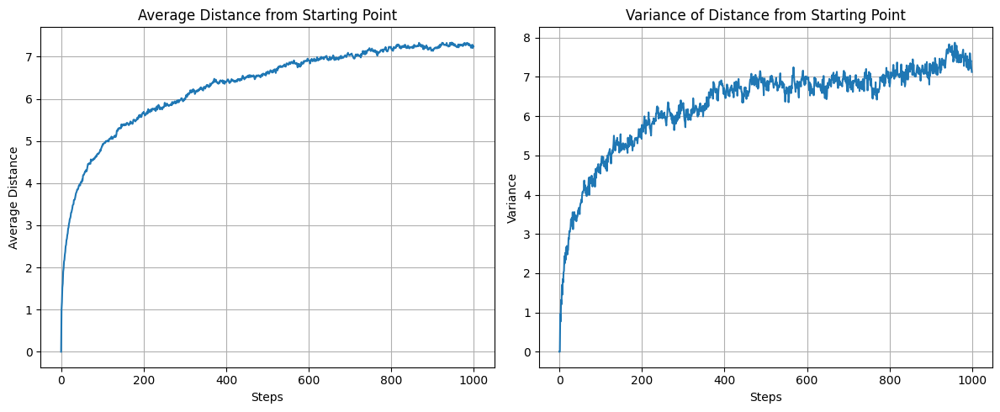

In [178]:
num_walks=1000
num_steps = 1000
avg_distance, var_distance = calculate_plot_avg_distance_stats(graph, num_walks, num_steps)

In [179]:
print(f"Average Distance from Starting Point: {avg_distance[-1]:.2f}")
print(f"Variance of Distance from Starting Point: {var_distance[-1]:.2f}")

Average Distance from Starting Point: 7.24
Variance of Distance from Starting Point: 7.12


### (c)

Average degree in overall graph: 2.00
Average degree of nodes reached by random walks: 3.98


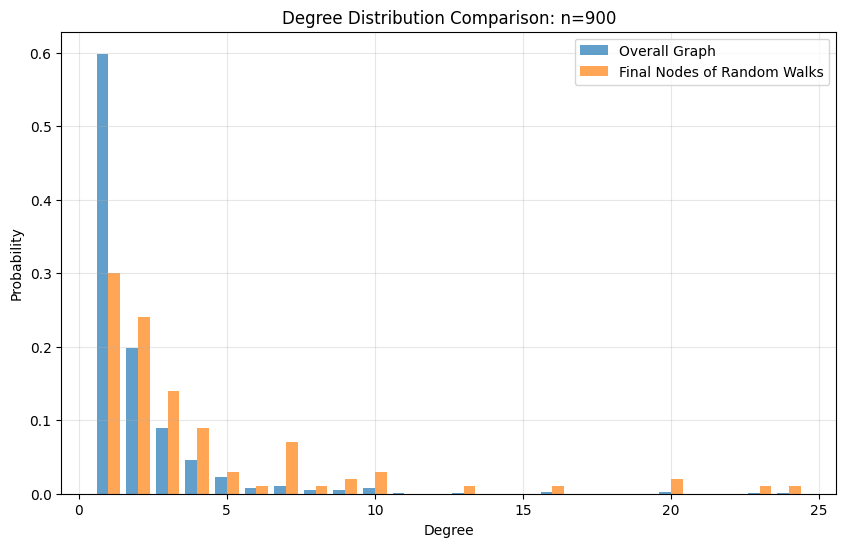

In [180]:
num_steps = 1000
num_walks = 100
measure_degree_distribution(graph, num_walks, num_steps)

* There are a few nodes with high degrees that are
connected to many other nodes so the majority of nodes having lower degrees.

* Since the preferential attachment network we
modeled had a fat-tailed distribution, the model has power-law degree distribution.

* Most of the vertices have very low degrees, but at the final nodes, the probability of reaching a high-degree vertex is higher.

### (d): explanation

<ipython-input-146-8b885ad856dd>:14: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances[walk, step] = graph.shortest_paths(start_node, current_node)[0][0]


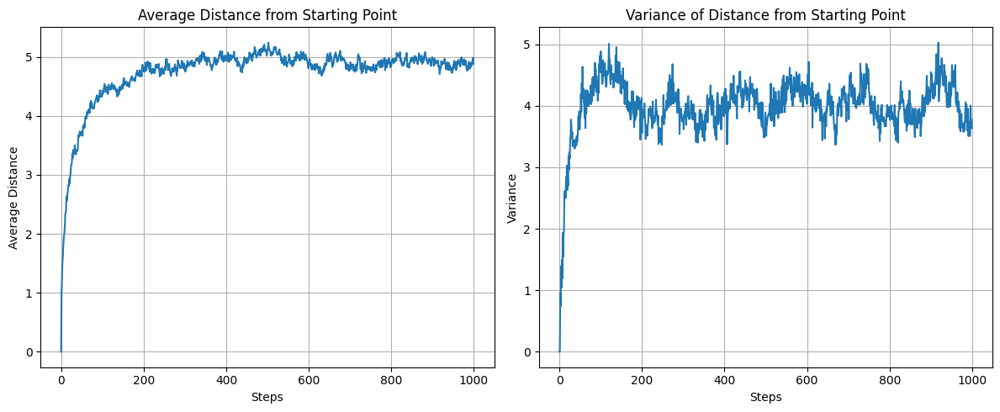

In [181]:
num_walks=300
num_steps = 1000
n = 90
graph = ig.Graph.Barabasi(n, m, directed=False)
avg_distance_n90, var_distance_n90 = calculate_plot_avg_distance_stats(graph, num_walks, num_steps)

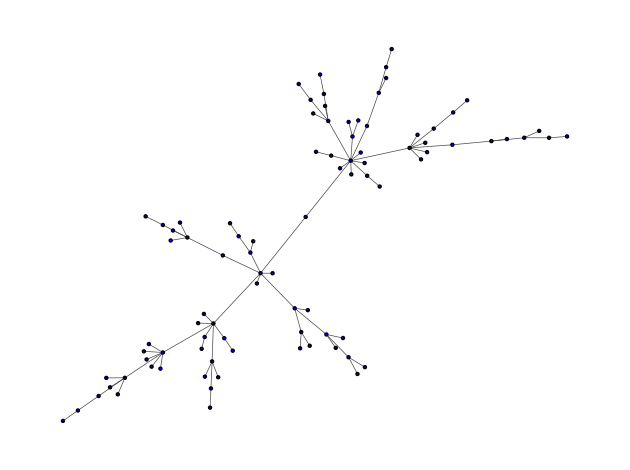

In [233]:
plot_graph(graph)

In [183]:
print("n=90")
print(f"Average Distance from Starting Point: {avg_distance_n90[-1]:.2f}")
print(f"Variance of Distance from Starting Point: {var_distance_n90[-1]:.2f}")

n=90
Average Distance from Starting Point: 4.88
Variance of Distance from Starting Point: 3.64


<ipython-input-146-8b885ad856dd>:14: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  distances[walk, step] = graph.shortest_paths(start_node, current_node)[0][0]


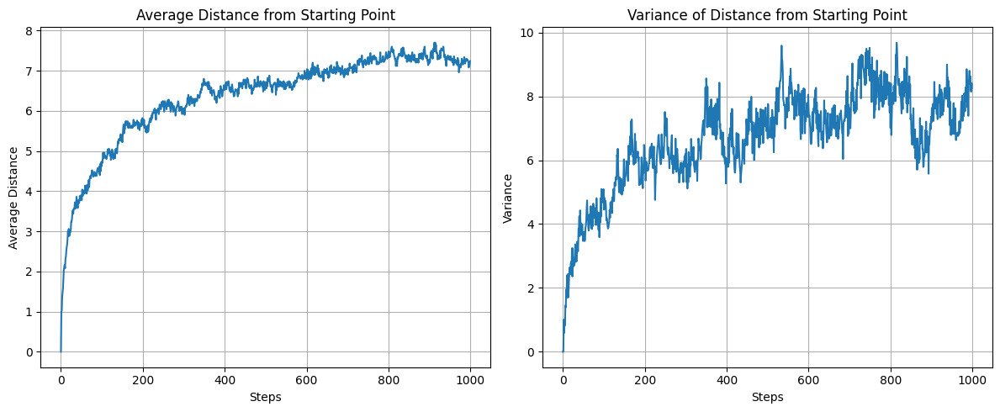

In [182]:
num_walks=100
num_steps = 1000
n = 9000
graph = ig.Graph.Barabasi(n, m, directed=False)
avg_distance_n9000, var_distance_n9000 = calculate_plot_avg_distance_stats(graph, num_walks, num_steps)

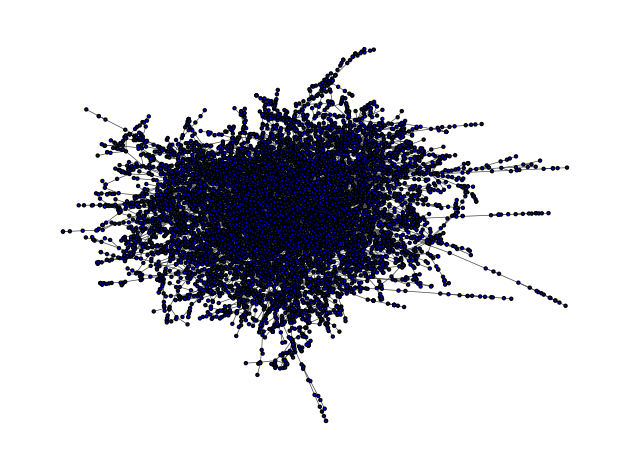

In [235]:
plot_graph(graph)

In [184]:
print("n=9000")
print(f"Average Distance from Starting Point: {avg_distance_n9000[-1]:.2f}")
print(f"Variance of Distance from Starting Point: {var_distance_n9000[-1]:.2f}")

n=9000
Average Distance from Starting Point: 7.24
Variance of Distance from Starting Point: 8.26


In [187]:
print("diameter for n = 90: ", ig.Graph.Barabasi(90, m, directed=False).diameter())
print("diameter for n = 9000: ", ig.Graph.Barabasi(9000, m, directed=False).diameter())

diameter for n = 90:  13
diameter for n = 9000:  31


* The diameter increases with increasing network size.

* The average distance increases as n increases.

* The variance also increase as n increases.

* In conclusion, while there are hubs with strong connectivity, they are far outnumbered by nodes with weak connections. As the network expands,
the well-connected hubs become more connected, while less connected nodes become even more isolated. Additionally, the average distance in the network increases, which correlates with a rise in its diameter as certain nodes experience greater isolation.

## 3- PageRank

### (a)

In [190]:
def plot_graph(graph):
  layout = graph.layout_fruchterman_reingold()
  ig.plot(graph, layout=layout, vertex_size=3, edge_width=0.5,
          vertex_color="blue", target=plt.gca())
  plt.axis('off')
  plt.tight_layout()
  plt.show()

In [188]:
n = 900
m = 4
graph_1 = ig.Graph.Barabasi(n, m, directed=True)
graph_2 = ig.Graph.Barabasi(n, m, directed=True)

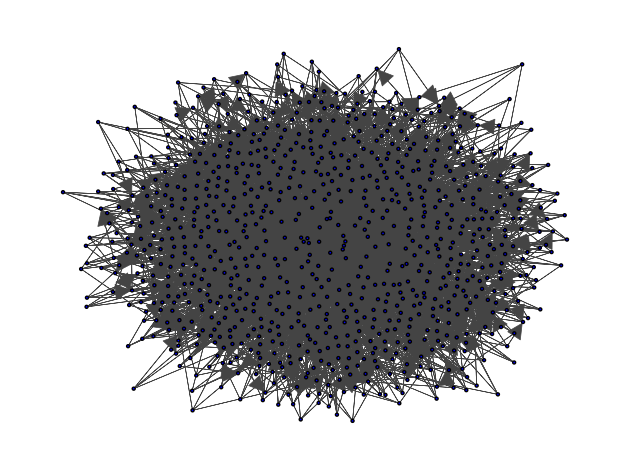

In [191]:
plot_graph(graph_1)

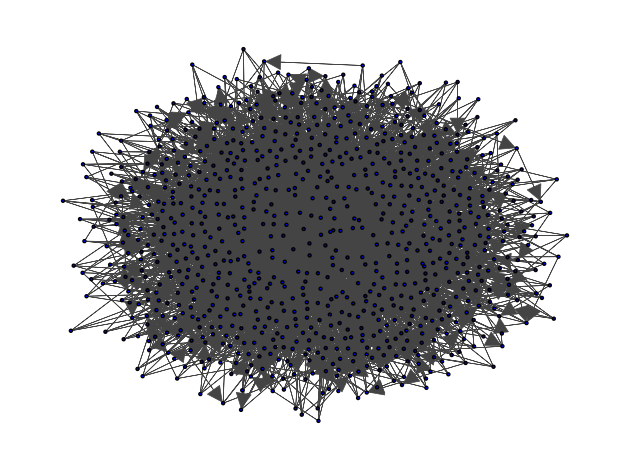

In [192]:
plot_graph(graph_2)

In [193]:
perm = np.random.permutation(n)
edges = graph_2.get_edgelist()
shuffled_edges = [(perm[e[0]], perm[e[1]]) for e in edges]
graph_1.add_edges(shuffled_edges)
graph_merged = graph_1

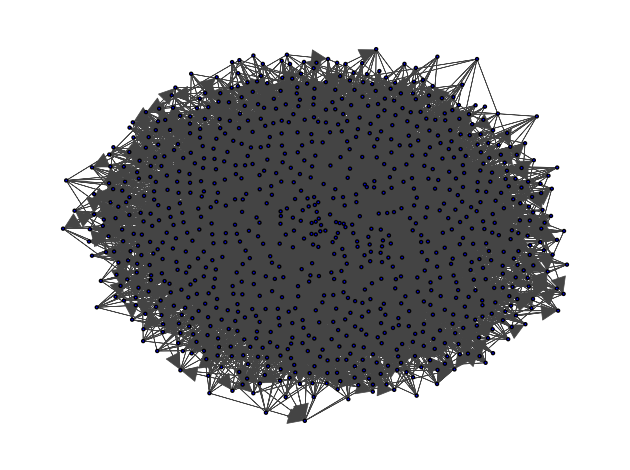

In [194]:
plot_graph(graph_merged)

In [195]:
out_degrees = graph_merged.degree(mode="OUT")
print(f"Min out-degree: {min(out_degrees)}, Max out-degree: {max(out_degrees)}")

Min out-degree: 4, Max out-degree: 8


In [196]:
def random_walk_with_teleportation(g, n, alpha=0.2, steps=100000, burn_in=10000):
    current_node = np.random.randint(0, n)
    visits = []

    for step in range(steps + burn_in):
        if np.random.random() < alpha:
            current_node = np.random.randint(0, n)
        else:
            out_neighbors = g.neighbors(current_node, mode="OUT")

            if not out_neighbors:
                current_node = np.random.randint(0, n)
            else:
                current_node = np.random.choice(out_neighbors)

        if step >= burn_in:
            visits.append(current_node)

    visit_counts = Counter(visits)
    total_visits = sum(visit_counts.values())
    visit_probs = {node: visit_counts.get(node, 0)/total_visits for node in range(n)}
    return visit_probs

def random_walk_without_teleportation(g, n, steps=100000, burn_in=10000):
    current_node = np.random.randint(0, n)
    visits = []

    for step in range(steps + burn_in):
        out_neighbors = g.neighbors(current_node, mode="OUT")

        if not out_neighbors:
            current_node = np.random.randint(0, n)
        else:
            current_node = np.random.choice(out_neighbors)

        if step >= burn_in:
            visits.append(current_node)

    visit_counts = Counter(visits)
    total_visits = sum(visit_counts.values())
    visit_probs = {node: visit_counts.get(node, 0)/total_visits for node in range(n)}

    return visit_probs

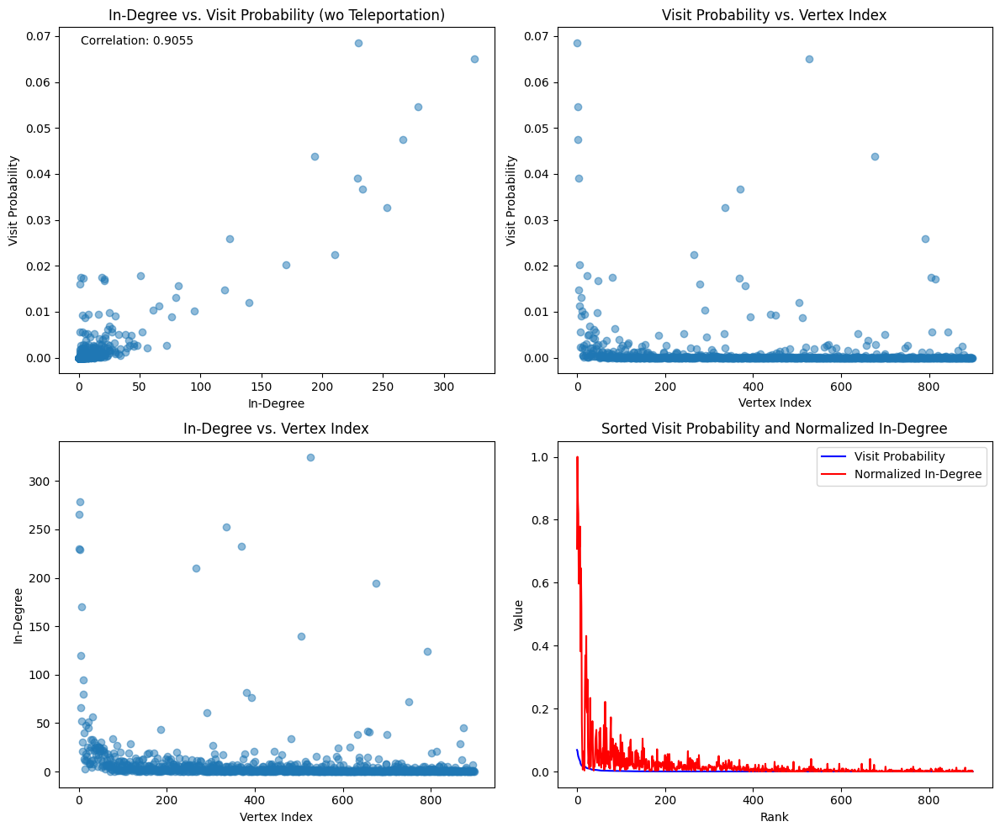

Correlation between in-degree and visit probability: 0.9055


In [201]:
no_teleport_probs = random_walk_without_teleportation(graph_merged, n)

in_degrees = graph_merged.degree(mode="IN")

nodes = list(range(n))
probs_list = [no_teleport_probs[i] for i in nodes]

plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.scatter(in_degrees, probs_list, alpha=0.5)
plt.xlabel('In-Degree')
plt.ylabel('Visit Probability')
plt.title('In-Degree vs. Visit Probability (wo Teleportation)')

corr_no_teleport = np.corrcoef(in_degrees, probs_list)[0, 1]
plt.annotate(f"Correlation: {corr_no_teleport:.4f}",
             xy=(0.05, 0.95), xycoords='axes fraction')

plt.subplot(2, 2, 2)
plt.scatter(nodes, probs_list, alpha=0.5)
plt.xlabel('Vertex Index')
plt.ylabel('Visit Probability')
plt.title('Visit Probability vs. Vertex Index')

plt.subplot(2, 2, 3)
plt.scatter(nodes, in_degrees, alpha=0.5)
plt.xlabel('Vertex Index')
plt.ylabel('In-Degree')
plt.title('In-Degree vs. Vertex Index')

plt.subplot(2, 2, 4)
sorted_indices = sorted(range(n), key=lambda i: probs_list[i], reverse=True)
sorted_probs = [probs_list[i] for i in sorted_indices]
sorted_degrees = [in_degrees[i] for i in sorted_indices]

plt.plot(range(n), sorted_probs, 'b-', label='Visit Probability')
plt.plot(range(n), [d/max(in_degrees) for d in sorted_degrees], 'r-',
         label='Normalized In-Degree')
plt.xlabel('Rank')
plt.ylabel('Value')
plt.title('Sorted Visit Probability and Normalized In-Degree')
plt.legend()

plt.tight_layout()
plt.show()

print(f"Correlation between in-degree and visit probability: {corr_no_teleport:.4f}")

* As it can be seen from the above figures, there is a linear relationship between the probability of visiting a
node and degree of that node.

* Reason: it is more probable to visit a node that has more
edges.

* There is no teleportation probability, therefore it is not possible for random walkers to
jump nodes that are not adjacent to the current node.

* Correlation between the probability of a node and the degree of that node is  0.9055.

### (b)

Without teleportation correlation: 0.9355
With teleportation correlation: 0.9603


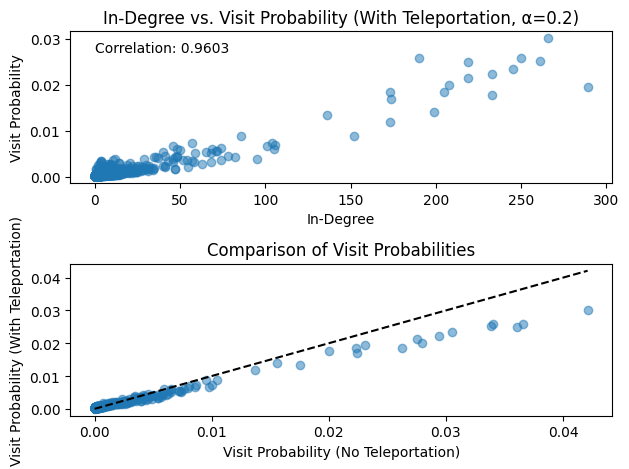

In [ ]:
teleport_probs = random_walk_with_teleportation(graph_merged, n=n, alpha=0.2)

teleport_probs_list = [teleport_probs[i] for i in nodes]

plt.subplot(2, 1, 1)
plt.scatter(in_degrees, teleport_probs_list, alpha=0.5)
plt.xlabel('In-Degree')
plt.ylabel('Visit Probability')
plt.title('In-Degree vs. Visit Probability (With Teleportation, α=0.2)')

corr_teleport = np.corrcoef(in_degrees, teleport_probs_list)[0, 1]
plt.text(min(in_degrees), max(teleport_probs_list)*0.9,
          f"Correlation: {corr_teleport:.4f}", fontsize=10)

plt.subplot(2, 1, 2)
plt.scatter(probs_list, teleport_probs_list, alpha=0.5)
plt.xlabel('Visit Probability (No Teleportation)')
plt.ylabel('Visit Probability (With Teleportation)')
plt.title('Comparison of Visit Probabilities')

max_val = max(max(probs_list), max(teleport_probs_list))
min_val = min(min(probs_list), min(teleport_probs_list))
plt.plot([min_val, max_val], [min_val, max_val], 'k--')

plt.tight_layout()

print(f"Without teleportation correlation: {corr_no_teleport:.4f}")
print(f"With teleportation correlation: {corr_teleport:.4f}")

Report:

Without teleportation: PR proportional to in-degree

With teleportation: PR = (1-α)(link-based) + α(uniform)

Teleportation reduces the influence of high in-degree nodes.

## 4- Personalized PageRank

### (a)

In [203]:
def pagerank(g, n, alpha=0.2, steps=100000, burn_in=10000):
    current_node = np.random.randint(0, n)
    visits = []

    for step in range(steps + burn_in):
        if np.random.random() < alpha:
            current_node = np.random.randint(0, n)
        else:
            out_neighbors = g.neighbors(current_node, mode="OUT")

            if not out_neighbors:
                current_node = np.random.randint(0, n)
            else:
                current_node = np.random.choice(out_neighbors)

        if step >= burn_in:
            visits.append(current_node)

    visit_counts = Counter(visits)
    total_visits = sum(visit_counts.values())
    visit_probs = np.array([visit_counts.get(node, 0)/total_visits for node in range(n)])

    return visit_probs

In [204]:
def personalized_pagerank(g, n, teleport_probs, alpha=0.2, steps=100000, burn_in=10000):
    teleport_probs = np.array(teleport_probs)
    teleport_probs = teleport_probs / np.sum(teleport_probs)

    current_node = np.random.choice(n, p=teleport_probs)
    visits = []

    for step in range(steps + burn_in):
        if np.random.random() < alpha:
            current_node = np.random.choice(n, p=teleport_probs)
        else:
            out_neighbors = g.neighbors(current_node, mode="OUT")

            if not out_neighbors:
                current_node = np.random.choice(n, p=teleport_probs)
            else:
                current_node = np.random.choice(out_neighbors)

        if step >= burn_in:
            visits.append(current_node)

    visit_counts = Counter(visits)
    total_visits = sum(visit_counts.values())
    visit_probs = np.array([visit_counts.get(node, 0)/total_visits for node in range(n)])

    return visit_probs

In [205]:
alpha = 0.2
standard_pagerank = pagerank(graph_merged, n, alpha)

In [206]:
pagerank_teleport_personalized = personalized_pagerank(graph_merged, n, standard_pagerank, alpha)

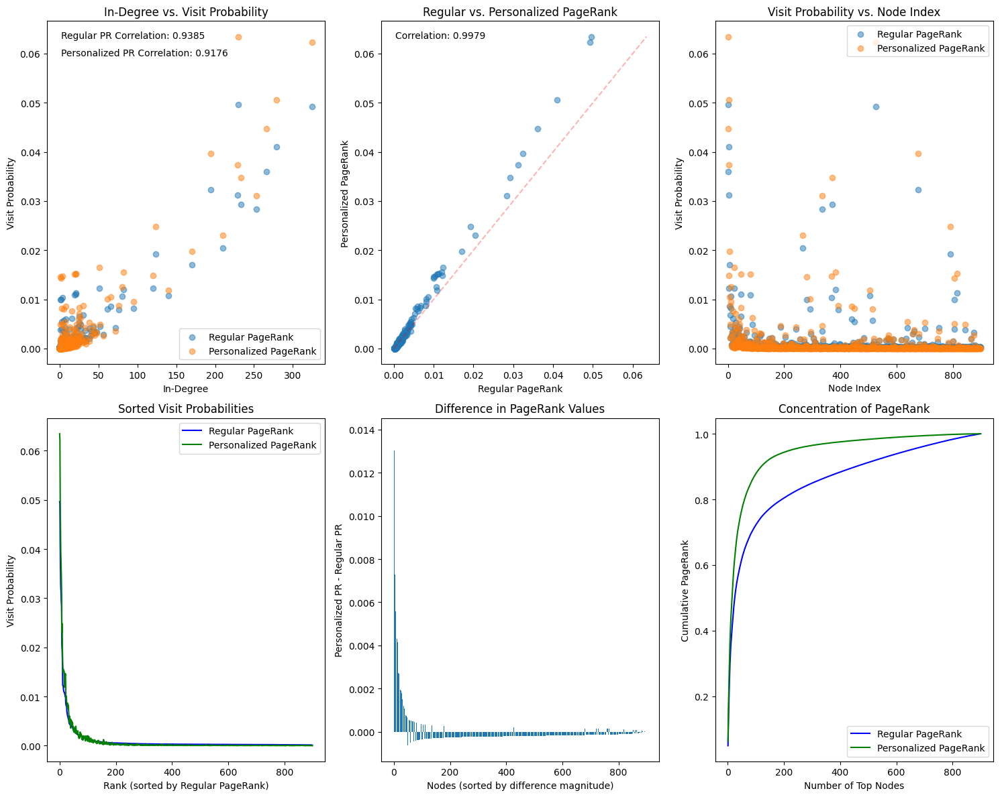

Correlation between in-degree and regular PageRank: 0.9385
Correlation between in-degree and personalized PageRank: 0.9176
Correlation between regular and personalized PageRank: 0.9979
Node with largest increase: 0
  Regular PR: 0.049650
  Personalized PR: 0.063460
  Increase: 0.013810
  In-degree: 230
Node with largest decrease: 32
  Regular PR: 0.002130
  Personalized PR: 0.001480
  Decrease: -0.000650
  In-degree: 33


In [208]:
in_degrees = graph_merged.degree(mode="IN")

nodes = list(range(n))
regular_probs = [standard_pagerank[i] for i in nodes]
personalized_probs = [pagerank_teleport_personalized[i] for i in nodes]

plt.figure(figsize=(15, 12))

plt.subplot(2, 3, 1)
plt.scatter(in_degrees, regular_probs, alpha=0.5, label='Regular PageRank')
plt.scatter(in_degrees, personalized_probs, alpha=0.5, label='Personalized PageRank')
plt.xlabel('In-Degree')
plt.ylabel('Visit Probability')
plt.title('In-Degree vs. Visit Probability')
plt.legend()

corr_regular = np.corrcoef(in_degrees, regular_probs)[0, 1]
corr_personalized = np.corrcoef(in_degrees, personalized_probs)[0, 1]
plt.annotate(f"Regular PR Correlation: {corr_regular:.4f}",
             xy=(0.05, 0.95), xycoords='axes fraction')
plt.annotate(f"Personalized PR Correlation: {corr_personalized:.4f}",
             xy=(0.05, 0.90), xycoords='axes fraction')

plt.subplot(2, 3, 2)
plt.scatter(regular_probs, personalized_probs, alpha=0.5)
plt.xlabel('Regular PageRank')
plt.ylabel('Personalized PageRank')
plt.title('Regular vs. Personalized PageRank')

max_val = max(max(regular_probs), max(personalized_probs))
plt.plot([0, max_val], [0, max_val], 'r--', alpha=0.3)

corr_pr_comparison = np.corrcoef(regular_probs, personalized_probs)[0, 1]
plt.annotate(f"Correlation: {corr_pr_comparison:.4f}",
             xy=(0.05, 0.95), xycoords='axes fraction')

plt.subplot(2, 3, 3)
plt.scatter(nodes, regular_probs, alpha=0.5, label='Regular PageRank')
plt.scatter(nodes, personalized_probs, alpha=0.5, label='Personalized PageRank')
plt.xlabel('Node Index')
plt.ylabel('Visit Probability')
plt.title('Visit Probability vs. Node Index')
plt.legend()

plt.subplot(2, 3, 4)
sorted_indices = sorted(range(n), key=lambda i: regular_probs[i], reverse=True)
sorted_regular = [regular_probs[i] for i in sorted_indices]
sorted_personalized = [personalized_probs[i] for i in sorted_indices]

plt.plot(range(n), sorted_regular, 'b-', label='Regular PageRank')
plt.plot(range(n), sorted_personalized, 'g-', label='Personalized PageRank')
plt.xlabel('Rank (sorted by Regular PageRank)')
plt.ylabel('Visit Probability')
plt.title('Sorted Visit Probabilities')
plt.legend()

plt.subplot(2, 3, 5)
differences = [personalized_probs[i] - regular_probs[i] for i in range(n)]
diff_sorted_indices = sorted(range(n), key=lambda i: abs(differences[i]), reverse=True)
sorted_diffs = [differences[i] for i in diff_sorted_indices]
sorted_nodes = [nodes[i] for i in diff_sorted_indices]

plt.bar(range(n), sorted_diffs)
plt.xlabel('Nodes (sorted by difference magnitude)')
plt.ylabel('Personalized PR - Regular PR')
plt.title('Difference in PageRank Values')

plt.subplot(2, 3, 6)
sorted_regular_cumsum = np.cumsum(sorted(regular_probs, reverse=True))
sorted_personalized_cumsum = np.cumsum(sorted(personalized_probs, reverse=True))

plt.plot(range(1, n+1), sorted_regular_cumsum, 'b-', label='Regular PageRank')
plt.plot(range(1, n+1), sorted_personalized_cumsum, 'g-', label='Personalized PageRank')
plt.xlabel('Number of Top Nodes')
plt.ylabel('Cumulative PageRank')
plt.title('Concentration of PageRank')
plt.legend()

plt.tight_layout()
plt.show()

print(f"Correlation between in-degree and regular PageRank: {corr_regular:.4f}")
print(f"Correlation between in-degree and personalized PageRank: {corr_personalized:.4f}")
print(f"Correlation between regular and personalized PageRank: {corr_pr_comparison:.4f}")

largest_increase_idx = np.argmax(differences)
largest_decrease_idx = np.argmin(differences)

print(f"Node with largest increase: {largest_increase_idx}")
print(f"  Regular PR: {regular_probs[largest_increase_idx]:.6f}")
print(f"  Personalized PR: {personalized_probs[largest_increase_idx]:.6f}")
print(f"  Increase: {differences[largest_increase_idx]:.6f}")
print(f"  In-degree: {in_degrees[largest_increase_idx]}")

print(f"Node with largest decrease: {largest_decrease_idx}")
print(f"  Regular PR: {regular_probs[largest_decrease_idx]:.6f}")
print(f"  Personalized PR: {personalized_probs[largest_decrease_idx]:.6f}")
print(f"  Decrease: {differences[largest_decrease_idx]:.6f}")
print(f"  In-degree: {in_degrees[largest_decrease_idx]}")

* The personalized PageRank approach amplifies the importance of already-important nodes.

### (b)

In [210]:
sorted_ranks = np.argsort(standard_pagerank)
median_idx = n // 2
median_nodes = [sorted_ranks[median_idx-1].item(), sorted_ranks[median_idx].item()]

print(f"Nodes with median PageRank: {median_nodes}")
print(f"Their PageRank values: {standard_pagerank[median_nodes]}")

Nodes with median PageRank: [179, 717]
Their PageRank values: [0.00029 0.00029]


Nodes with median PageRank: [424, 566]
Their PageRank values: 0.00029, 0.00029
Correlation between in-degree and standard PageRank: 0.9399
Correlation between in-degree and median-teleport PageRank: 0.5693
Correlation between standard and median-teleport PageRank: 0.6092
Node with largest increase: 566
  Standard PR: 0.000290
  Median-teleport PR: 0.100140
  Increase: 0.099850
  In-degree: 2
Node with largest decrease: 1
  Standard PR: 0.035710
  Median-teleport PR: 0.026890
  Decrease: -0.008820
  In-degree: 266


<ipython-input-212-99fb347f5fdc>:109: RuntimeWarning: Couldn't reach some vertices at src/paths/unweighted.c:444
  path = graph_merged.get_shortest_paths(median_node, to=node)[0]


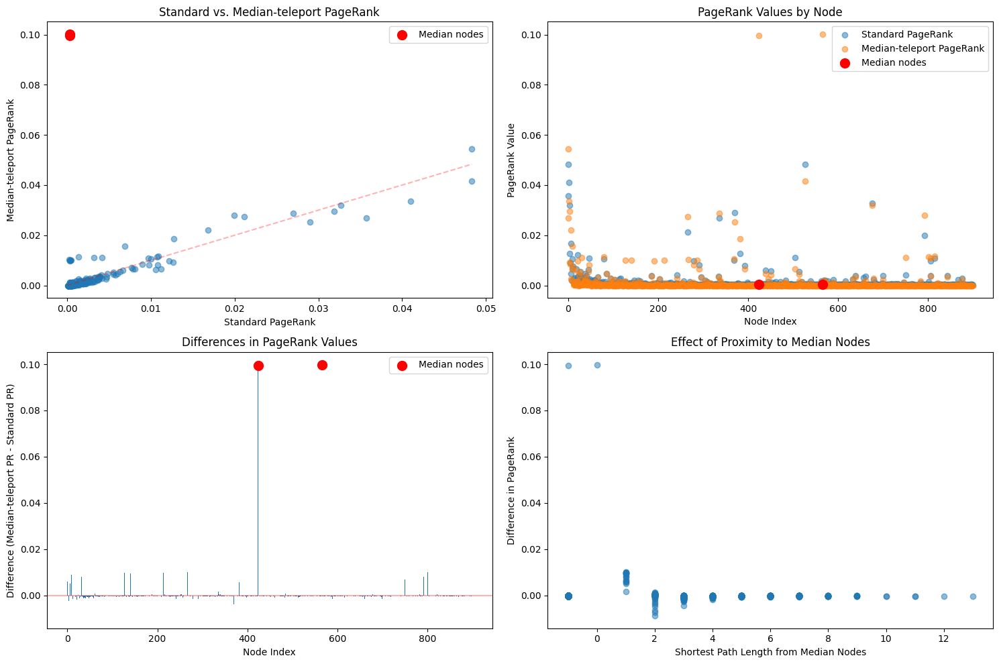

In [212]:
def personalized_pagerank_median_teleport(g, n, median_nodes, alpha=0.2, steps=100000, burn_in=10000):
    teleport_probs = np.zeros(n)
    for node in median_nodes:
        teleport_probs[node] = 0.5

    current_node = np.random.choice(median_nodes)
    visits = []

    for step in range(steps + burn_in):
        if np.random.random() < alpha:
            current_node = np.random.choice(range(n), p=teleport_probs)
        else:
            out_neighbors = g.neighbors(current_node, mode="OUT")

            if not out_neighbors:
                current_node = np.random.choice(range(n), p=teleport_probs)
            else:
                current_node = np.random.choice(out_neighbors)

        if step >= burn_in:
            visits.append(current_node)

    visit_counts = Counter(visits)
    total_visits = sum(visit_counts.values())
    median_teleport_pr = np.array([visit_counts.get(node, 0)/total_visits for node in range(n)])

    return median_teleport_pr

standard_pagerank = pagerank(graph_merged, n)

sorted_ranks = np.argsort(standard_pagerank)
median_idx = n // 2
median_nodes = [sorted_ranks[median_idx-1].item(), sorted_ranks[median_idx].item()]

print(f"Nodes with median PageRank: {median_nodes}")
print(f"Their PageRank values: {standard_pagerank[median_nodes[0]]}, {standard_pagerank[median_nodes[1]]}")

median_teleport_pr = personalized_pagerank_median_teleport(graph_merged, n, median_nodes)

nodes = list(range(n))
standard_probs = [standard_pagerank[i] for i in nodes]
median_teleport_probs = [median_teleport_pr[i] for i in nodes]
in_degrees = graph_merged.degree(mode="IN")

corr_standard = np.corrcoef(in_degrees, standard_probs)[0, 1]
corr_median_teleport = np.corrcoef(in_degrees, median_teleport_probs)[0, 1]
corr_comparison = np.corrcoef(standard_probs, median_teleport_probs)[0, 1]

print(f"Correlation between in-degree and standard PageRank: {corr_standard:.4f}")
print(f"Correlation between in-degree and median-teleport PageRank: {corr_median_teleport:.4f}")
print(f"Correlation between standard and median-teleport PageRank: {corr_comparison:.4f}")

differences = [median_teleport_probs[i] - standard_probs[i] for i in range(n)]
largest_increase_idx = np.argmax(differences)
largest_decrease_idx = np.argmin(differences)

print(f"Node with largest increase: {largest_increase_idx}")
print(f"  Standard PR: {standard_probs[largest_increase_idx]:.6f}")
print(f"  Median-teleport PR: {median_teleport_probs[largest_increase_idx]:.6f}")
print(f"  Increase: {differences[largest_increase_idx]:.6f}")
print(f"  In-degree: {in_degrees[largest_increase_idx]}")

print(f"Node with largest decrease: {largest_decrease_idx}")
print(f"  Standard PR: {standard_probs[largest_decrease_idx]:.6f}")
print(f"  Median-teleport PR: {median_teleport_probs[largest_decrease_idx]:.6f}")
print(f"  Decrease: {differences[largest_decrease_idx]:.6f}")
print(f"  In-degree: {in_degrees[largest_decrease_idx]}")

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.scatter(standard_probs, median_teleport_probs, alpha=0.5)
plt.scatter([standard_probs[median_nodes[0]], standard_probs[median_nodes[1]]],
           [median_teleport_probs[median_nodes[0]], median_teleport_probs[median_nodes[1]]],
           color='red', s=100, label='Median nodes')
plt.xlabel('Standard PageRank')
plt.ylabel('Median-teleport PageRank')
plt.title('Standard vs. Median-teleport PageRank')
plt.plot([0, max(standard_probs)], [0, max(standard_probs)], 'r--', alpha=0.3)
plt.legend()

plt.subplot(2, 2, 2)
plt.scatter(nodes, standard_probs, alpha=0.5, label='Standard PageRank')
plt.scatter(nodes, median_teleport_probs, alpha=0.5, label='Median-teleport PageRank')
plt.scatter([median_nodes[0], median_nodes[1]],
           [standard_probs[median_nodes[0]], standard_probs[median_nodes[1]]],
           color='red', s=100, label='Median nodes')
plt.xlabel('Node Index')
plt.ylabel('PageRank Value')
plt.title('PageRank Values by Node')
plt.legend()

plt.subplot(2, 2, 3)
plt.bar(nodes, differences)
plt.axhline(y=0, color='r', linestyle='-', alpha=0.3)
plt.scatter([median_nodes[0], median_nodes[1]],
           [differences[median_nodes[0]], differences[median_nodes[1]]],
           color='red', s=100, label='Median nodes')
plt.xlabel('Node Index')
plt.ylabel('Difference (Median-teleport PR - Standard PR)')
plt.title('Differences in PageRank Values')
plt.legend()

path_proximity = np.zeros(n)
for node in range(n):
    shortest_paths = []
    for median_node in median_nodes:
        try:
            path = graph_merged.get_shortest_paths(median_node, to=node)[0]
            path_length = len(path) - 1
            shortest_paths.append(path_length)
        except:
            shortest_paths.append(float('inf'))
    path_proximity[node] = min(shortest_paths)

plt.subplot(2, 2, 4)
valid_indices = [i for i in range(n) if path_proximity[i] != float('inf')]
valid_proximities = [path_proximity[i] for i in valid_indices]
valid_differences = [differences[i] for i in valid_indices]

plt.scatter(valid_proximities, valid_differences, alpha=0.5)
plt.xlabel('Shortest Path Length from Median Nodes')
plt.ylabel('Difference in PageRank')
plt.title('Effect of Proximity to Median Nodes')

plt.tight_layout()
plt.show()

* The median nodes experienced increases in their PageRank values. Node 566 went from 0.00029 to 0.100140.

* The correlation between standard PageRank and median-teleport PageRank dropped.

* The correlation between in-degree and PageRank dropped. It shows that network structure has less influence on importance.

* The "Standard vs. Median-teleport PageRank" plot shows how most nodes fall along a line, but the median nodes are outliers.

* The "Differences in PageRank Values" plot dramatically illustrates how one of the median nodes gained enormous importance while most other nodes saw minimal changes.

### (c)

Nodes with median PageRank: [827, 258]
Their PageRank values: 0.00029, 0.00029
Correlation between standard and reinforced PageRank: 0.6038
Correlation between visiting probability and reinforced PageRank: 0.9999
Node with largest increase: 258
  Standard PR: 0.000290
  Reinforced PR: 0.100000
  Increase: 0.099710
Node with largest decrease: 1
  Standard PR: 0.036290
  Reinforced PR: 0.028947
  Decrease: -0.007343


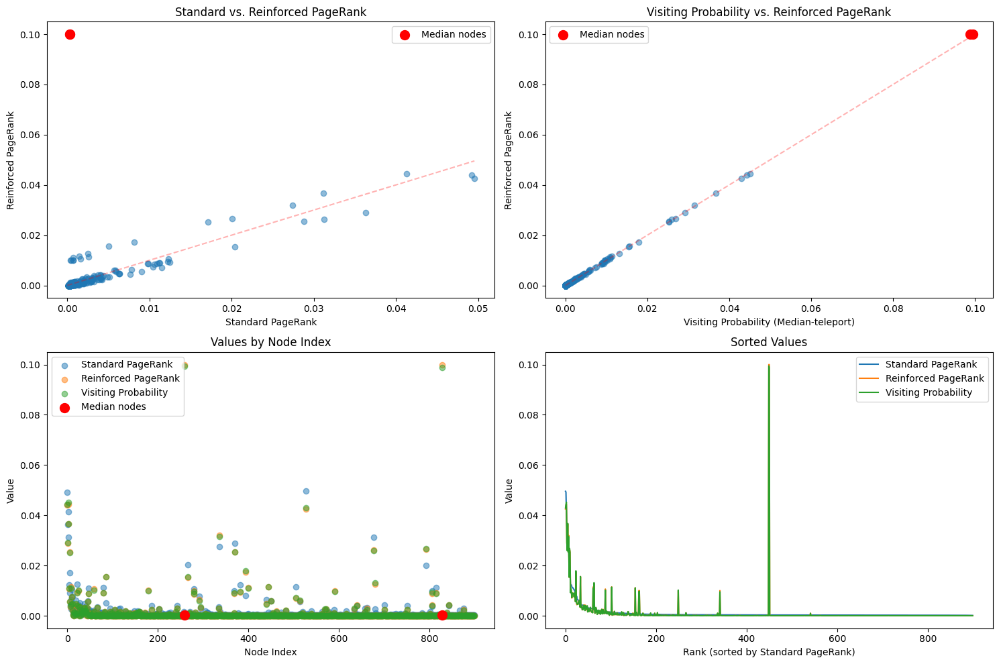

In [215]:
def personalized_pagerank_with_reinforcement(g, n, median_nodes, alpha=0.2, max_iter=100, tol=1e-6):
    teleport_vector = np.zeros(n)
    for node in median_nodes:
        teleport_vector[node] = 0.5

    pr = np.ones(n) / n

    for _ in range(max_iter):
        old_pr = pr.copy()

        new_pr = np.zeros(n)

        new_pr += alpha * teleport_vector

        for i in range(n):
            out_neighbors = g.neighbors(i, mode="OUT")
            if out_neighbors:
                for j in out_neighbors:
                    new_pr[j] += (1 - alpha) * pr[i] / len(out_neighbors)
            else:
                new_pr += (1 - alpha) * pr[i] * teleport_vector

        if np.sum(np.abs(new_pr - pr)) < tol:
            return new_pr

        pr = new_pr

    return pr

standard_pagerank = pagerank(graph_merged, n)
sorted_ranks = np.argsort(standard_pagerank)
median_idx = n // 2
median_nodes = [sorted_ranks[median_idx-1].item(), sorted_ranks[median_idx].item()]

print(f"Nodes with median PageRank: {median_nodes}")
print(f"Their PageRank values: {standard_pagerank[median_nodes[0]]}, {standard_pagerank[median_nodes[1]]}")

reinforced_pr = personalized_pagerank_with_reinforcement(graph_merged, n, median_nodes)

nodes = list(range(n))
standard_probs = [standard_pagerank[i] for i in nodes]
reinforced_probs = [reinforced_pr[i] for i in nodes]

corr_standard_reinforced = np.corrcoef(standard_probs, reinforced_probs)[0, 1]
print(f"Correlation between standard and reinforced PageRank: {corr_standard_reinforced:.4f}")

median_teleport_pr = personalized_pagerank_median_teleport(graph_merged, n, median_nodes)
median_teleport_probs = [median_teleport_pr[i] for i in nodes]

corr_teleport_reinforced = np.corrcoef(median_teleport_probs, reinforced_probs)[0, 1]
print(f"Correlation between visiting probability and reinforced PageRank: {corr_teleport_reinforced:.4f}")

differences = [reinforced_probs[i] - standard_probs[i] for i in range(n)]
largest_increase_idx = np.argmax(differences)
largest_decrease_idx = np.argmin(differences)

print(f"Node with largest increase: {largest_increase_idx}")
print(f"  Standard PR: {standard_probs[largest_increase_idx]:.6f}")
print(f"  Reinforced PR: {reinforced_probs[largest_increase_idx]:.6f}")
print(f"  Increase: {differences[largest_increase_idx]:.6f}")

print(f"Node with largest decrease: {largest_decrease_idx}")
print(f"  Standard PR: {standard_probs[largest_decrease_idx]:.6f}")
print(f"  Reinforced PR: {reinforced_probs[largest_decrease_idx]:.6f}")
print(f"  Decrease: {differences[largest_decrease_idx]:.6f}")

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.scatter(standard_probs, reinforced_probs, alpha=0.5)
plt.scatter([standard_probs[median_nodes[0]], standard_probs[median_nodes[1]]],
           [reinforced_probs[median_nodes[0]], reinforced_probs[median_nodes[1]]],
           color='red', s=100, label='Median nodes')
plt.xlabel('Standard PageRank')
plt.ylabel('Reinforced PageRank')
plt.title('Standard vs. Reinforced PageRank')
plt.plot([0, max(standard_probs)], [0, max(standard_probs)], 'r--', alpha=0.3)
plt.legend()

plt.subplot(2, 2, 2)
plt.scatter(median_teleport_probs, reinforced_probs, alpha=0.5)
plt.scatter([median_teleport_probs[median_nodes[0]], median_teleport_probs[median_nodes[1]]],
           [reinforced_probs[median_nodes[0]], reinforced_probs[median_nodes[1]]],
           color='red', s=100, label='Median nodes')
plt.xlabel('Visiting Probability (Median-teleport)')
plt.ylabel('Reinforced PageRank')
plt.title('Visiting Probability vs. Reinforced PageRank')
plt.plot([0, max(median_teleport_probs)], [0, max(median_teleport_probs)], 'r--', alpha=0.3)
plt.legend()

plt.subplot(2, 2, 3)
plt.scatter(nodes, standard_probs, alpha=0.5, label='Standard PageRank')
plt.scatter(nodes, reinforced_probs, alpha=0.5, label='Reinforced PageRank')
plt.scatter(nodes, median_teleport_probs, alpha=0.5, label='Visiting Probability')
plt.scatter(median_nodes, [standard_probs[i] for i in median_nodes],
           color='red', s=100, label='Median nodes')
plt.xlabel('Node Index')
plt.ylabel('Value')
plt.title('Values by Node Index')
plt.legend()

plt.subplot(2, 2, 4)
sorted_indices = np.argsort(standard_probs)[::-1]
plt.plot([i for i in range(n)], [standard_probs[i] for i in sorted_indices],
         label='Standard PageRank')
plt.plot([i for i in range(n)], [reinforced_probs[i] for i in sorted_indices],
         label='Reinforced PageRank')
plt.plot([i for i in range(n)], [median_teleport_probs[i] for i in sorted_indices],
         label='Visiting Probability')
plt.xlabel('Rank (sorted by Standard PageRank)')
plt.ylabel('Value')
plt.title('Sorted Values')
plt.legend()

plt.tight_layout()
plt.show()

* Node 258 dramatically boosts its importance despite having an average ranking in the standard algorithm.

* Node 1 appears to have had a structural advantage in the standard PageRank (perhaps incoming links), but this advantage was partially offset in the reinforced model as importance shifted toward trusted teleportation nodes.

* The median-ranked nodes (827 and 258): one remained at the median while the other became extremely important, therefore, personalization can completely reshape rankings.

* The perfect correlation between visiting probability and reinforced PageRank